In [ ]:
import pandas as pd
from functools import partial
from pybedtools import BedTool
import plotly.express as px
from umap import UMAP
import hdbscan
import umap.plot
umap.plot.output_notebook()
from pybedtools import BedTool

Loading BokehJS ...

In [ ]:
pd.__version__

'1.5.2'

In [ ]:
pd.read_csv("/lab/corradin_data/FOR_hannahR/sum_df_anova_neun.csv")

,gene_name,1027_ACG_NeuN,1134_ACG_NeuN,1135_ACG_NeuN,1027_NAc_NeuN,1134_NAc_NeuN,1135_NAc_NeuN,1136_Hypo_NeuN,1364_Hypo_NeuN,4599_Hypo_NeuN,...,HctMZ_Amyg_NeuN,HctTS_Amyg_NeuN,HctCY_OFC_NeuN,HctRP_OFC_NeuN,HctRS_OFC_NeuN,HctQQ_PFC_NeuN,HctSK_PFC_NeuN,HctTS_PFC_NeuN,f_value,p_value
0,10-Mar,160.99400,161.66500,148.28800,162.70300,159.89300,162.35100,148.9190,150.06900,146.20100,...,163.99500,170.8810,170.0620,151.78300,190.92400,161.13600,146.45700,160.77100,1.662462,0.202805
1,10-Sep,4.78604,4.73386,4.58033,5.10027,4.39599,4.78449,5.4385,5.14709,5.36072,...,5.42846,5.0263,4.9893,5.60083,5.16934,5.10474,5.64238,5.24663,1.918436,0.147802
2,11-Mar,21.12740,18.55110,20.18920,20.83210,16.91110,20.97900,18.5944,21.42290,22.93890,...,19.63920,19.3382,18.2863,21.69830,22.13810,22.82990,22.09330,20.68650,0.898447,0.522599
3,11-Sep,175.35700,165.44100,161.05800,156.61300,147.32900,155.15000,143.0430,148.41100,150.57600,...,163.15700,156.6370,175.2060,173.28700,187.60300,182.29900,179.30600,176.58000,12.952481,0.000052
4,12-Sep,48.57810,47.71770,47.72930,47.42580,45.66490,47.89300,45.5519,43.35160,46.89150,...,49.00260,49.0748,51.0071,44.44040,45.50780,46.50250,47.96390,45.99110,1.207310,0.358586
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18129,ZXDC,288.20700,291.84800,295.95200,235.91600,241.26600,235.37400,295.7120,285.18600,280.45800,...,285.96500,260.5090,310.6980,267.10000,330.21700,293.43100,269.48000,268.09600,5.283198,0.004895
18130,ZYG11B,22.10630,21.27400,17.41310,20.52050,19.94890,21.26870,22.4720,21.78450,22.10310,...,21.79100,23.5426,22.9213,20.78560,19.34220,20.69700,20.37080,23.13150,0.586651,0.735793
18131,ZYX,161.54500,163.97700,162.23800,146.71100,132.62700,145.42700,112.9520,113.70700,107.96200,...,138.59300,132.3850,170.0860,156.94400,229.78500,180.58000,160.21100,149.70700,6.466625,0.001959
18132,ZZEF1;CYB5D2,165.69100,175.22300,166.57000,171.07800,178.55900,175.39400,158.2140,165.15200,156.81200,...,177.70100,181.4830,176.4250,151.76200,170.61500,164.72700,160.12800,169.59200,1.534417,0.238006


In [ ]:
def get_bingren_2022_brain_ATAC_data(file_name, NA_col=None, **kwargs):
    base_url = "http://renlab.sdsc.edu/yangli/downloads/humanbrain/"
    if file_name.endswith(".xlsx"):
        read_func = pd.read_excel
    else:
        read_func = partial(pd.read_csv, sep = "\t")
    
    if file_name.startswith("Table"):
        url = f"{base_url}/Supplementary_Tables/{file_name}"
    else:
        url = f"{base_url}/{file_name}"
    
    formatted_url = url.replace(" ", "%20")
    df = read_func(formatted_url, **kwargs)
    
    if NA_col is not None:
        df = df.query(f"{NA_col}.notna()")
    return df

In [ ]:
def intersect_bed_dfs(df1, df2):
    columns_list = df1.rename(columns = {"chrom": "chrom_1", "start": "start_1", "stop": "stop_1", "peak": "peak_1"}).columns.tolist() + df2.rename(columns = {"chrom": "chrom_2", "start": "start_2", "stop": "stop_2", "peak": "peak_2"}).columns.tolist()
    
    
    df = BedTool.from_dataframe(df1, header = df1.columns.tolist())\
.intersect(BedTool.from_dataframe(df2, header = df2.columns.tolist()), wa= True, wb = True).to_dataframe(disable_auto_names= True).T.reset_index().T.reset_index(drop = True)
    
    df.columns = columns_list
    
    return df


In [ ]:
bingren_cell_type_metadata = get_bingren_2022_brain_ATAC_data("Table S4 - Human brain cell taxonmy and annotation.xlsx")
bingren_cell_type_metadata["cell_type"] = bingren_cell_type_metadata["Cell type"].str.replace("-", "_")
bingren_cell_type_metadata.loc[bingren_cell_type_metadata.eval("cell_type.str.startswith('IT') or `Cell subclass`.str.startswith('IT')"), "cell_type"] = bingren_cell_type_metadata[bingren_cell_type_metadata\
.eval("cell_type.str.startswith('IT') or `Cell subclass`.str.startswith('IT')")]["cell_type"].str.replace("_L", "L").str.replace("_V", "V").str.replace("/", "")
bingren_cell_type_metadata.loc[bingren_cell_type_metadata.eval("`Cell subclass` == 'MSN' and `Cell type`.str.startswith('D')"), "cell_type"] = bingren_cell_type_metadata.loc[bingren_cell_type_metadata.eval("`Cell subclass` == 'MSN' and `Cell type`.str.startswith('D')"), "cell_type"]\
.str.replace("/","").str.replace("_", "")
bingren_cell_type_metadata["cell_type"] = bingren_cell_type_metadata["cell_type"].replace({"LAMP5_1" : "LAMP5", "LAMP5_2": "LAMP5_LHX6"})
bingren_cell_type_metadata.loc[bingren_cell_type_metadata.eval("`Cell subclass name` == 'Bergmann glia'"), "Cell type name"] = "Bergmann glia"
bingren_cell_type_metadata

HTTPError: HTTP Error 404: Not Found

### Ask Authors about `cell_type CTXMIX`!!!

In [ ]:
bingren_cell_type_metadata.query("cell_type.str.startswith('IT')")

,Cell class,Cell class name,Cell class color,Cell subclass,Cell subclass name,Cell subclass color,Cell type,Cell type name,Cell type color,cell_type
58,GLUT,Glutamatergic neurons,#cb6751,IT-L2/3,"Intratelencephalic projecting neurons, cortica...",#ff7985,IT-L2/3-1,"Intratelencephalic projecting neurons, cortica...",#a1183f,ITL23_1
59,GLUT,Glutamatergic neurons,#cb6751,IT-L2/3,"Intratelencephalic projecting neurons, cortica...",#ff7985,IT-L2/3-2,"Intratelencephalic projecting neurons, cortica...",#cd004a,ITL23_2
60,GLUT,Glutamatergic neurons,#cb6751,IT-L2/3,"Intratelencephalic projecting neurons, cortica...",#ff7985,IT-L2/3-3,"Intratelencephalic projecting neurons, cortica...",#ff7985,ITL23_3
61,GLUT,Glutamatergic neurons,#cb6751,IT-L2/3,"Intratelencephalic projecting neurons, cortica...",#ff7985,IT-L2/3-4,"Intratelencephalic projecting neurons, cortica...",#f22652,ITL23_4
62,GLUT,Glutamatergic neurons,#cb6751,IT-L2/3,"Intratelencephalic projecting neurons, cortica...",#ff7985,IT-L2/3-5,"Intratelencephalic projecting neurons, cortica...",#ff9797,ITL23_5
63,GLUT,Glutamatergic neurons,#cb6751,IT-L2/3,"Intratelencephalic projecting neurons, cortica...",#ff7985,IT-L2/3-6,"Intratelencephalic projecting neurons, cortica...",#992832,ITL23_6
64,GLUT,Glutamatergic neurons,#cb6751,IT-L3/4,"Intratelencephalic projecting neurons, cortica...",#e83038,ITL34,"Intratelencephalic projecting neurons, cortica...",#e83038,ITL34
65,GLUT,Glutamatergic neurons,#cb6751,IT-L4,"Intratelencephalic projecting neurons, cortica...",#ff7560,IT-L4-1,"Intratelencephalic projecting neurons, cortica...",#ff7560,ITL4_1
66,GLUT,Glutamatergic neurons,#cb6751,IT-L4,"Intratelencephalic projecting neurons, cortica...",#ff7560,IT-L4-2,"Intratelencephalic projecting neurons, cortica...",#ba1504,ITL4_2
67,GLUT,Glutamatergic neurons,#cb6751,IT-L4/5,"Intratelencephalic projecting neurons, cortica...",#ae001d,IT-L4/5-1,"Intratelencephalic projecting neurons, cortica...",#ae001d,ITL45_1


In [ ]:
bingren_peak_cell_type_assignment = get_bingren_2022_brain_ATAC_data("Table S7 - Cell type assignment of cCREs in bed format.gz", header = None, names = ["chrom", "start", "stop", "cCRE_ID", "cell_type"])
bingren_peak_cell_type_assignment["peak"] = bingren_peak_cell_type_assignment[["chrom", "start", "stop"]].astype(str).apply("_".join, axis = 1)
bingren_peak_cell_type_assignment

,chrom,start,stop,cCRE_ID,cell_type,peak
0,chr1,9848,10347,cCRE_1,"AMY,ASCT_1,ASCT_2,ASCT_3,COP,ERC_1,ITL23_1,ITL...",chr1_9848_10347
1,chr1,180570,181069,cCRE_2,"ACBGM,AMY,ASCNT_1,ASCNT_3,ASCT_1,ASCT_2,ASCT_3...",chr1_180570_181069
2,chr1,191227,191726,cCRE_3,"ASCNT_1,ASCNT_2,ASCNT_3,ASCT_1,ASCT_2,ASCT_3,C...",chr1_191227_191726
3,chr1,267759,268258,cCRE_4,"ASCT_2,ASCT_3,OGC_1,OGC_2,OGC_3,OPC",chr1_267759_268258
4,chr1,585948,586447,cCRE_5,"ASCT_2,OGC_2,OGC_3,OPC",chr1_585948_586447
...,...,...,...,...,...,...
544724,chrY,56727893,56728392,cCRE_544731,"ACBGM,ASCNT_1,ASCT_1,ASCT_2,ASCT_3,CBGRC,ITL23...",chrY_56727893_56728392
544725,chrY,56734541,56735040,cCRE_544732,"ASCNT_1,ASCNT_2,ASCNT_3,ASCT_1,ASCT_2,ASCT_3,C...",chrY_56734541_56735040
544726,chrY,56742465,56742964,cCRE_544733,"ASCT_1,OGC_1",chrY_56742465_56742964
544727,chrY,56763271,56763770,cCRE_544734,"AMY,ASCNT_1,ASCT_1,ASCT_2,ASCT_3,BFEXA,CBGRC,C...",chrY_56763271_56763770


In [ ]:
bingren_peak_cell_type_full_name_df = (bingren_peak_cell_type_assignment\
.assign(cell_type = bingren_peak_cell_type_assignment["cell_type"].str.split(","))\
.explode("cell_type")\
.merge(bingren_cell_type_metadata, how = "left"))\
.query("cell_type != 'CTXMIX'").groupby("peak")["Cell type name"].unique().apply(",".join).reset_index(name = "cell_type_name")
bingren_peak_cell_type_full_name_df

,peak,cell_type_name
0,chr10_100000240_100000739,"PVALB+ GABAergic neurons - type 3,Glutamatergi..."
1,chr10_100006219_100006718,"Intratelencephalic projecting neurons, cortica..."
2,chr10_100009113_100009612,"Glutamatergic neurons from amygdala,Telencepha..."
3,chr10_100009715_100010214,"Bergmann glia,Glutamatergic neurons from amygd..."
4,chr10_100010367_100010866,"Glutamatergic neurons from amygdala,Granule ne..."
...,...,...
544561,chrY_9810670_9811169,"Intratelencephalic projecting neurons, cortica..."
544562,chrY_9811882_9812381,VIP+ GABAergic neurons - type 4
544563,chrY_9894711_9895210,"D1- medium spiny neurons from putamen,D2- medi..."
544564,chrY_9952376_9952875,"Intratelencephalic projecting neurons, cortica..."


In [ ]:
bingren_peak_cell_type_assignment_merged = bingren_peak_cell_type_assignment.merge(bingren_peak_cell_type_full_name_df, how = "left")
bingren_peak_cell_type_assignment_merged

,chrom,start,stop,cCRE_ID,cell_type,peak,cell_type_name
0,chr1,9848,10347,cCRE_1,"AMY,ASCT_1,ASCT_2,ASCT_3,COP,ERC_1,ITL23_1,ITL...",chr1_9848_10347,"Glutamatergic neurons from amygdala,Telencepha..."
1,chr1,180570,181069,cCRE_2,"ACBGM,AMY,ASCNT_1,ASCNT_3,ASCT_1,ASCT_2,ASCT_3...",chr1_180570_181069,"Bergmann glia,Glutamatergic neurons from amygd..."
2,chr1,191227,191726,cCRE_3,"ASCNT_1,ASCNT_2,ASCNT_3,ASCT_1,ASCT_2,ASCT_3,C...",chr1_191227_191726,"Non-telencephalon astrocytes - type 1,Non-tele..."
3,chr1,267759,268258,cCRE_4,"ASCT_2,ASCT_3,OGC_1,OGC_2,OGC_3,OPC",chr1_267759_268258,"Telencephalon astrocytes - type 2,Telencephalo..."
4,chr1,585948,586447,cCRE_5,"ASCT_2,OGC_2,OGC_3,OPC",chr1_585948_586447,"Telencephalon astrocytes - type 2,Oligodendroc..."
...,...,...,...,...,...,...,...
544724,chrY,56727893,56728392,cCRE_544731,"ACBGM,ASCNT_1,ASCT_1,ASCT_2,ASCT_3,CBGRC,ITL23...",chrY_56727893_56728392,"Bergmann glia,Non-telencephalon astrocytes - t..."
544725,chrY,56734541,56735040,cCRE_544732,"ASCNT_1,ASCNT_2,ASCNT_3,ASCT_1,ASCT_2,ASCT_3,C...",chrY_56734541_56735040,"Non-telencephalon astrocytes - type 1,Non-tele..."
544726,chrY,56742465,56742964,cCRE_544733,"ASCT_1,OGC_1",chrY_56742465_56742964,"Telencephalon astrocytes - type 1,Oligodendroc..."
544727,chrY,56763271,56763770,cCRE_544734,"AMY,ASCNT_1,ASCT_1,ASCT_2,ASCT_3,BFEXA,CBGRC,C...",chrY_56763271_56763770,"Glutamatergic neurons from amygdala,Non-telenc..."


---

In [ ]:
bingren_peak_cell_type_assignment_merged = pd.read_csv("../../data/01_raw/bingren_peak_cell_type_binary.tsv", sep = "\t")
bingren_peak_cell_type_assignment_merged

,chrom,start,stop,cCRE_ID,cell_type,peak,cell_type_name
0,chr1,9848,10347,cCRE_1,"AMY,ASCT_1,ASCT_2,ASCT_3,COP,ERC_1,ITL23_1,ITL...",chr1_9848_10347,"Glutamatergic neurons from amygdala,Telencepha..."
1,chr1,180570,181069,cCRE_2,"ACBGM,AMY,ASCNT_1,ASCNT_3,ASCT_1,ASCT_2,ASCT_3...",chr1_180570_181069,"Bergmann glia,Glutamatergic neurons from amygd..."
2,chr1,191227,191726,cCRE_3,"ASCNT_1,ASCNT_2,ASCNT_3,ASCT_1,ASCT_2,ASCT_3,C...",chr1_191227_191726,"Non-telencephalon astrocytes - type 1,Non-tele..."
3,chr1,267759,268258,cCRE_4,"ASCT_2,ASCT_3,OGC_1,OGC_2,OGC_3,OPC",chr1_267759_268258,"Telencephalon astrocytes - type 2,Telencephalo..."
4,chr1,585948,586447,cCRE_5,"ASCT_2,OGC_2,OGC_3,OPC",chr1_585948_586447,"Telencephalon astrocytes - type 2,Oligodendroc..."
...,...,...,...,...,...,...,...
544724,chrY,56727893,56728392,cCRE_544731,"ACBGM,ASCNT_1,ASCT_1,ASCT_2,ASCT_3,CBGRC,ITL23...",chrY_56727893_56728392,"Bergmann glia,Non-telencephalon astrocytes - t..."
544725,chrY,56734541,56735040,cCRE_544732,"ASCNT_1,ASCNT_2,ASCNT_3,ASCT_1,ASCT_2,ASCT_3,C...",chrY_56734541_56735040,"Non-telencephalon astrocytes - type 1,Non-tele..."
544726,chrY,56742465,56742964,cCRE_544733,"ASCT_1,OGC_1",chrY_56742465_56742964,"Telencephalon astrocytes - type 1,Oligodendroc..."
544727,chrY,56763271,56763770,cCRE_544734,"AMY,ASCNT_1,ASCT_1,ASCT_2,ASCT_3,BFEXA,CBGRC,C...",chrY_56763271_56763770,"Glutamatergic neurons from amygdala,Non-telenc..."


In [ ]:
anova_sig_brain_regions_threshold_binary = pd.read_csv("../../data/02_intermediate/anova/anova_sig_brain_regions_threshold_binary.tsv", sep = "\t")
anova_sig_brain_regions_threshold_binary[["chrom", "start", "stop"]] = anova_sig_brain_regions_threshold_binary["peak"].str.split("_", expand = True)
anova_sig_brain_regions_threshold_binary = anova_sig_brain_regions_threshold_binary.set_index(["chrom", "start", "stop"]).reset_index()
anova_sig_brain_regions_threshold_binary

,chrom,start,stop,peak,ACG_mean_lower_than_1_25,Amyg_mean_lower_than_1_25,Hipp_mean_lower_than_1_25,Hypo_mean_lower_than_1_25,NAc_mean_lower_than_1_25,OFC_mean_lower_than_1_25,PFC_mean_lower_than_1_25,ACG_mean_higher_than_1_75,Amyg_mean_higher_than_1_75,Hipp_mean_higher_than_1_75,Hypo_mean_higher_than_1_75,NAc_mean_higher_than_1_75,OFC_mean_higher_than_1_75,PFC_mean_higher_than_1_75,p_value
0,chr10,100089200,100089418,chr10_100089200_100089418,1,1,1,1,0,1,1,0,0,0,0,0,0,0,0.001082
1,chr10,10024360,10024700,chr10_10024360_10024700,1,1,1,1,0,1,1,0,0,0,0,0,0,0,0.029680
2,chr10,100327020,100327222,chr10_100327020_100327222,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0.029820
3,chr10,100327060,100327500,chr10_100327060_100327500,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0.023121
4,chr10,100327298,100327466,chr10_100327298_100327466,0,0,0,1,1,0,0,0,0,1,0,0,1,0,0.018381
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93963,chrX,9913420,9913740,chrX_9913420_9913740,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0.005478
93964,chrX,9927580,9927820,chrX_9927580_9927820,1,0,1,0,1,1,1,0,0,0,0,0,0,0,0.017494
93965,chrX,9927752,9927983,chrX_9927752_9927983,1,0,1,0,1,1,1,0,0,0,0,0,0,0,0.011265
93966,chrX,9927956,9928092,chrX_9927956_9928092,1,0,1,0,1,1,1,0,0,0,0,0,0,0,0.011407


In [ ]:
anova_sig_cross_on_off_thresholds_peaks_NAc_or_Amyg_on = pd.concat([pd.read_csv("../../data/02_intermediate/anova/cross_on_off_thresholds_peaks/anova_sig_peaks_on_in_NAc/NAc_on_peaks_and_info.tsv", sep = "\t"), pd.read_csv("../../data/02_intermediate/anova/cross_on_off_thresholds_peaks/anova_sig_peaks_on_in_Amyg/Amyg_on_peaks_and_info.tsv", sep = "\t")]).drop_duplicates("peak")
anova_sig_cross_on_off_thresholds_peaks_NAc_or_Amyg_on[["chrom", "start", "stop"]] = anova_sig_cross_on_off_thresholds_peaks_NAc_or_Amyg_on["peak"].str.split("_", expand = True)
anova_sig_cross_on_off_thresholds_peaks_NAc_or_Amyg_on = anova_sig_cross_on_off_thresholds_peaks_NAc_or_Amyg_on.set_index(["chrom", "start", "stop"]).reset_index()
anova_sig_cross_on_off_thresholds_peaks_NAc_on = anova_sig_cross_on_off_thresholds_peaks_NAc_or_Amyg_on.query("NAc_higher_than_1_75 == 1")
anova_sig_cross_on_off_thresholds_peaks_Amyg_on = anova_sig_cross_on_off_thresholds_peaks_NAc_or_Amyg_on.query("Amyg_higher_than_1_75 == 1")
anova_sig_cross_on_off_thresholds_peaks_NAc_or_Amyg_on

,chrom,start,stop,peak,num_regions_lower_than_1.25,num_regions_higher_than_1.75,p_value,ACG_lower_than_1_25,Amyg_lower_than_1_25,Hipp_lower_than_1_25,...,NAc_higher_than_1_75,OFC_higher_than_1_75,PFC_higher_than_1_75,ACG_mean,Amyg_mean,Hipp_mean,Hypo_mean,NAc_mean,OFC_mean,PFC_mean
0,chr11,110022204,110022501,chr11_110022204_110022501,6,1,7.900885e-09,1,1,1,...,1,0,0,0.936287,1.047284,1.010940,1.004249,1.768444,1.027254,1.043786
1,chr15,94282705,94282935,chr15_94282705_94282935,6,1,1.047372e-08,1,1,1,...,1,0,0,1.016275,0.944251,0.959424,0.982225,1.814794,1.001123,1.053637
2,chr10,62790172,62790260,chr10_62790172_62790260,6,1,1.268766e-08,1,1,1,...,1,0,0,1.073570,1.083171,1.095107,1.051420,2.269635,1.044719,1.164096
3,chr19,35513069,35513280,chr19_35513069_35513280,3,1,1.332303e-08,0,1,0,...,1,0,0,1.415817,1.100205,1.272054,1.268146,1.943363,1.187807,1.131638
4,chr3,115072340,115072580,chr3_115072340_115072580,5,1,3.340605e-08,1,1,0,...,1,0,0,0.959358,1.229252,1.250095,1.155009,1.862354,0.853392,1.206647
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5663,chr9,124017203,124017525,chr9_124017203_124017525,1,5,4.789900e-02,0,0,0,...,0,1,1,2.017092,1.789529,2.176180,1.147341,1.550548,2.129276,1.972380
5664,chr6,7542237,7542550,chr6_7542237_7542550,1,2,4.906503e-02,0,0,0,...,0,0,0,1.514366,1.916068,2.335022,1.187962,1.616962,1.256629,1.250514
5665,chr16,87517644,87517842,chr16_87517644_87517842,1,5,4.909603e-02,0,0,0,...,0,1,1,1.944238,1.780413,1.832193,1.199012,1.715623,2.234573,1.921864
5666,chr9,71120900,71121160,chr9_71120900_71121160,1,1,4.932611e-02,0,0,0,...,0,0,0,1.530619,1.802023,1.311278,1.723649,1.246008,1.447015,1.455238


In [ ]:
anova_sig_brain_regions_threshold_binary_on_NAc = anova_sig_brain_regions_threshold_binary.query("NAc_mean_higher_than_1_75 == 1")
anova_sig_brain_regions_threshold_binary_on_Amyg = anova_sig_brain_regions_threshold_binary.query("Amyg_mean_higher_than_1_75 == 1")
anova_sig_brain_regions_threshold_binary_on_NAc_or_Amyg = pd.concat([anova_sig_brain_regions_threshold_binary_on_NAc, anova_sig_brain_regions_threshold_binary_on_Amyg]).drop_duplicates("peak")
anova_sig_brain_regions_threshold_binary_on_NAc_or_Amyg

,chrom,start,stop,peak,ACG_mean_lower_than_1_25,Amyg_mean_lower_than_1_25,Hipp_mean_lower_than_1_25,Hypo_mean_lower_than_1_25,NAc_mean_lower_than_1_25,OFC_mean_lower_than_1_25,PFC_mean_lower_than_1_25,ACG_mean_higher_than_1_75,Amyg_mean_higher_than_1_75,Hipp_mean_higher_than_1_75,Hypo_mean_higher_than_1_75,NAc_mean_higher_than_1_75,OFC_mean_higher_than_1_75,PFC_mean_higher_than_1_75,p_value
7,chr10,100372840,100373060,chr10_100372840_100373060,0,0,0,0,0,0,0,0,0,1,1,1,0,1,0.003071
8,chr10,100373006,100373140,chr10_100373006_100373140,0,0,0,0,0,0,0,0,1,1,1,1,1,1,0.007995
9,chr10,100373090,100373244,chr10_100373090_100373244,0,0,0,0,0,0,0,0,1,1,1,1,1,1,0.014161
10,chr10,100373353,100373588,chr10_100373353_100373588,0,0,0,0,0,0,0,1,1,1,1,1,1,1,0.028732
25,chr10,101008040,101008240,chr10_101008040_101008240,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0.007008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93901,chrX,80808740,80808938,chrX_80808740_80808938,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0.007300
93902,chrX,80808914,80809273,chrX_80808914_80809273,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0.008056
93903,chrX,80809220,80809439,chrX_80809220_80809439,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0.012117
93904,chrX,80809418,80809577,chrX_80809418_80809577,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0.031981


In [ ]:
anova_sig_cross_on_off_thresholds_peaks_NAc_on

,chrom,start,stop,peak,num_regions_lower_than_1.25,num_regions_higher_than_1.75,p_value,ACG_lower_than_1_25,Amyg_lower_than_1_25,Hipp_lower_than_1_25,...,NAc_higher_than_1_75,OFC_higher_than_1_75,PFC_higher_than_1_75,ACG_mean,Amyg_mean,Hipp_mean,Hypo_mean,NAc_mean,OFC_mean,PFC_mean
0,chr11,110022204,110022501,chr11_110022204_110022501,6,1,7.900885e-09,1,1,1,...,1,0,0,0.936287,1.047284,1.010940,1.004249,1.768444,1.027254,1.043786
1,chr15,94282705,94282935,chr15_94282705_94282935,6,1,1.047372e-08,1,1,1,...,1,0,0,1.016275,0.944251,0.959424,0.982225,1.814794,1.001123,1.053637
2,chr10,62790172,62790260,chr10_62790172_62790260,6,1,1.268766e-08,1,1,1,...,1,0,0,1.073570,1.083171,1.095107,1.051420,2.269635,1.044719,1.164096
3,chr19,35513069,35513280,chr19_35513069_35513280,3,1,1.332303e-08,0,1,0,...,1,0,0,1.415817,1.100205,1.272054,1.268146,1.943363,1.187807,1.131638
4,chr3,115072340,115072580,chr3_115072340_115072580,5,1,3.340605e-08,1,1,0,...,1,0,0,0.959358,1.229252,1.250095,1.155009,1.862354,0.853392,1.206647
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4822,chr8,142940055,142940260,chr8_142940055_142940260,5,1,4.964906e-02,0,1,1,...,1,0,0,1.271663,1.207561,1.152761,1.058720,2.014347,1.069903,1.139924
4823,chr5,79840152,79840294,chr5_79840152_79840294,1,4,4.968009e-02,0,0,0,...,1,1,1,1.781168,1.705797,1.657993,1.162607,2.100015,2.288866,2.025091
4824,chr3,184757480,184757677,chr3_184757480_184757677,1,4,4.976328e-02,0,0,0,...,1,1,1,1.608870,1.729516,1.925474,1.244908,1.902394,1.894907,1.816451
4825,chr11,1940129,1940324,chr11_1940129_1940324,1,6,4.993888e-02,0,0,0,...,1,1,1,2.463793,1.923925,2.037807,1.238886,1.983572,2.331604,1.883476


In [ ]:
anova_sig_cross_on_off_thresholds_peaks_NAc_on

,chrom,start,stop,peak,num_regions_lower_than_1.25,num_regions_higher_than_1.75,p_value,ACG_lower_than_1_25,Amyg_lower_than_1_25,Hipp_lower_than_1_25,...,NAc_higher_than_1_75,OFC_higher_than_1_75,PFC_higher_than_1_75,ACG_mean,Amyg_mean,Hipp_mean,Hypo_mean,NAc_mean,OFC_mean,PFC_mean
0,chr11,110022204,110022501,chr11_110022204_110022501,6,1,7.900885e-09,1,1,1,...,1,0,0,0.936287,1.047284,1.010940,1.004249,1.768444,1.027254,1.043786
1,chr15,94282705,94282935,chr15_94282705_94282935,6,1,1.047372e-08,1,1,1,...,1,0,0,1.016275,0.944251,0.959424,0.982225,1.814794,1.001123,1.053637
2,chr10,62790172,62790260,chr10_62790172_62790260,6,1,1.268766e-08,1,1,1,...,1,0,0,1.073570,1.083171,1.095107,1.051420,2.269635,1.044719,1.164096
3,chr19,35513069,35513280,chr19_35513069_35513280,3,1,1.332303e-08,0,1,0,...,1,0,0,1.415817,1.100205,1.272054,1.268146,1.943363,1.187807,1.131638
4,chr3,115072340,115072580,chr3_115072340_115072580,5,1,3.340605e-08,1,1,0,...,1,0,0,0.959358,1.229252,1.250095,1.155009,1.862354,0.853392,1.206647
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4822,chr8,142940055,142940260,chr8_142940055_142940260,5,1,4.964906e-02,0,1,1,...,1,0,0,1.271663,1.207561,1.152761,1.058720,2.014347,1.069903,1.139924
4823,chr5,79840152,79840294,chr5_79840152_79840294,1,4,4.968009e-02,0,0,0,...,1,1,1,1.781168,1.705797,1.657993,1.162607,2.100015,2.288866,2.025091
4824,chr3,184757480,184757677,chr3_184757480_184757677,1,4,4.976328e-02,0,0,0,...,1,1,1,1.608870,1.729516,1.925474,1.244908,1.902394,1.894907,1.816451
4825,chr11,1940129,1940324,chr11_1940129_1940324,1,6,4.993888e-02,0,0,0,...,1,1,1,2.463793,1.923925,2.037807,1.238886,1.983572,2.331604,1.883476


In [ ]:
bingren_peak_cell_type_assignment_merged

,chrom,start,stop,cCRE_ID,cell_type,peak,cell_type_name
0,chr1,9848,10347,cCRE_1,"AMY,ASCT_1,ASCT_2,ASCT_3,COP,ERC_1,ITL23_1,ITL...",chr1_9848_10347,"Glutamatergic neurons from amygdala,Telencepha..."
1,chr1,180570,181069,cCRE_2,"ACBGM,AMY,ASCNT_1,ASCNT_3,ASCT_1,ASCT_2,ASCT_3...",chr1_180570_181069,"Bergmann glia,Glutamatergic neurons from amygd..."
2,chr1,191227,191726,cCRE_3,"ASCNT_1,ASCNT_2,ASCNT_3,ASCT_1,ASCT_2,ASCT_3,C...",chr1_191227_191726,"Non-telencephalon astrocytes - type 1,Non-tele..."
3,chr1,267759,268258,cCRE_4,"ASCT_2,ASCT_3,OGC_1,OGC_2,OGC_3,OPC",chr1_267759_268258,"Telencephalon astrocytes - type 2,Telencephalo..."
4,chr1,585948,586447,cCRE_5,"ASCT_2,OGC_2,OGC_3,OPC",chr1_585948_586447,"Telencephalon astrocytes - type 2,Oligodendroc..."
...,...,...,...,...,...,...,...
544724,chrY,56727893,56728392,cCRE_544731,"ACBGM,ASCNT_1,ASCT_1,ASCT_2,ASCT_3,CBGRC,ITL23...",chrY_56727893_56728392,"Bergmann glia,Non-telencephalon astrocytes - t..."
544725,chrY,56734541,56735040,cCRE_544732,"ASCNT_1,ASCNT_2,ASCNT_3,ASCT_1,ASCT_2,ASCT_3,C...",chrY_56734541_56735040,"Non-telencephalon astrocytes - type 1,Non-tele..."
544726,chrY,56742465,56742964,cCRE_544733,"ASCT_1,OGC_1",chrY_56742465_56742964,"Telencephalon astrocytes - type 1,Oligodendroc..."
544727,chrY,56763271,56763770,cCRE_544734,"AMY,ASCNT_1,ASCT_1,ASCT_2,ASCT_3,BFEXA,CBGRC,C...",chrY_56763271_56763770,"Glutamatergic neurons from amygdala,Non-telenc..."


In [ ]:
anova_sig_cross_on_off_thresholds_peaks_NAc_or_Amyg_on_with_cell_type = intersect_bed_dfs(anova_sig_cross_on_off_thresholds_peaks_NAc_or_Amyg_on,
                  bingren_peak_cell_type_assignment_merged)
anova_sig_cross_on_off_thresholds_peaks_NAc_on_with_cell_type = intersect_bed_dfs(anova_sig_cross_on_off_thresholds_peaks_NAc_on,
                  bingren_peak_cell_type_assignment_merged)
anova_sig_cross_on_off_thresholds_peaks_Amyg_on_with_cell_type = intersect_bed_dfs(anova_sig_cross_on_off_thresholds_peaks_Amyg_on,
                  bingren_peak_cell_type_assignment_merged)
anova_sig_cross_on_off_thresholds_peaks_NAc_or_Amyg_on_with_cell_type

,chrom_1,start_1,stop_1,peak_1,num_regions_lower_than_1.25,num_regions_higher_than_1.75,p_value,ACG_lower_than_1_25,Amyg_lower_than_1_25,Hipp_lower_than_1_25,...,NAc_mean,OFC_mean,PFC_mean,chrom_2,start_2,stop_2,cCRE_ID,cell_type,peak_2,cell_type_name
0,chr11,110022204,110022501,chr11_110022204_110022501,6,1,7.900885009011404e-09,1.1,1.2,1.3,...,1.7684443998952766,1.0272539422476032,1.04378560243249,chr11.1,110021942,110022441,cCRE_91783,"ASCNT_1,ASCNT_2,ASCNT_3,ASCT_1,ASCT_2,ASCT_3,C...",chr11_110021942_110022441,"Non-telencephalon astrocytes - type 1,Non-tele..."
1,chr15,94282705,94282935,chr15_94282705_94282935,6,1,0.0,1,1,1,...,1.814794,1.001123,1.053637,chr15,94282420,94282919,cCRE_174360,"D12NAC,D1CaB,D2CaB,D2Pu,MSN_1,THMGA_1",chr15_94282420_94282919,D1-/D2- medium spiny neurons from nucleus Accu...
2,chr10,62790172,62790260,chr10_62790172_62790260,6,1,0.0,1,1,1,...,2.269635,1.044719,1.164096,chr10,62790105,62790604,cCRE_56143,"BFEXA,BNGA,D12NAC,D1CaB,D1Pu,D2CaB,D2Pu,MSN_1,...",chr10_62790105_62790604,Inhibitory neurons from basal forebrain and ex...
3,chr11,110022640,110022840,chr11_110022640_110022840,6,1,0.0,1,1,1,...,1.894167,1.04324,1.067345,chr11,110022603,110023102,cCRE_91784,"ASCT_1,ASCT_2,ASCT_3,BFEXA,D12NAC,D1CaB,D1Pu,D...",chr11_110022603_110023102,"Telencephalon astrocytes - type 1,Telencephalo..."
4,chr9,36819825,36820640,chr9_36819825_36820640,1,1,0.0,0,0,0,...,2.607152,1.284087,1.274047,chr9,36820304,36820803,cCRE_510837,"AMY,BNGA,D12NAC,D1CaB,D1Pu,D2CaB,D2Pu,ERC_1,FO...",chr9_36820304_36820803,"Glutamatergic neurons from amygdala,GABAergic ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4402,chr9,119026320,119026540,chr9_119026320_119026540,2,3,0.047052,0,0,0,...,1.147095,1.864788,1.679071,chr9,119026019,119026518,cCRE_522242,"ACBGM,ASCNT_1,ASCNT_2,ASCNT_3,ASCT_1,ASCT_2,AS...",chr9_119026019_119026518,"Bergmann glia,Non-telencephalon astrocytes - t..."
4403,chr17,69501600,69501860,chr17_69501600_69501860,1,5,0.047804,0,0,0,...,1.171274,2.109569,1.770744,chr17,69501166,69501665,cCRE_199217,"AMY,ASCT_2,ASCT_3,CBGRC,CHO,CNGA_1,CNGA_2,COP,...",chr17_69501166_69501665,"Glutamatergic neurons from amygdala,Telencepha..."
4404,chr6,7542237,7542550,chr6_7542237_7542550,1,2,0.049065,0,0,0,...,1.616962,1.256629,1.250514,chr6,7542411,7542910,cCRE_412697,"AMY,ASCT_1,ASCT_2,COP,ITL23_2,MGC_1,OGC_1,OGC_...",chr6_7542411_7542910,"Glutamatergic neurons from amygdala,Telencepha..."
4405,chr16,87517644,87517842,chr16_87517644_87517842,1,5,0.049096,0,0,0,...,1.715623,2.234573,1.921864,chr16,87517458,87517957,cCRE_188160,"AMY,BFEXA,BNGA,CBGRC,CT_1,CT_2,D12NAC,D1CaB,D1...",chr16_87517458_87517957,"Glutamatergic neurons from amygdala,Inhibitory..."


In [ ]:
anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type = intersect_bed_dfs(anova_sig_cross_on_off_thresholds_peaks_NAc_on,
                  bingren_peak_cell_type_assignment_merged)
anova_sig_brain_regions_threshold_binary_on_Amyg_with_cell_type = intersect_bed_dfs(anova_sig_cross_on_off_thresholds_peaks_Amyg_on,
                  bingren_peak_cell_type_assignment_merged)

In [ ]:
data_df = anova_sig_cross_on_off_thresholds_peaks_NAc_or_Amyg_on_with_cell_type
col = "cell_type_name_exploded"
num_display_cell_type = 20

def plot_cell_type_merged_bingren(data_df, col= "cell_type_name_exploded", num_display_cell_type = 20, p_value_thresh = None):
    plot_df = data_df.assign(cell_type_name_exploded = data_df.cell_type_name.str.split(","),
                            cell_type_exploded = data_df.cell_type.str.split(","))\
    .explode(["cell_type_name_exploded"])
    
    plot_df = plot_df.drop_duplicates(["peak_1", col])
    if p_value_thresh:
        plot_df["p_value"] = plot_df["p_value"].astype(float)
        plot_df = plot_df.query("p_value < @p_value_thresh")
    
    display(plot_df.groupby("peak_1")["cell_type_name_exploded"].nunique().sort_values())
    cell_type_count = plot_df.drop_duplicates(["peak_1", "cell_type_name_exploded"])[col].value_counts()
    display(cell_type_count)
    if num_display_cell_type:
        display_cell_types = cell_type_count.head(num_display_cell_type).index.tolist() + cell_type_count.tail(num_display_cell_type).index.tolist()
        display_plot_df = plot_df.set_index(col).loc[display_cell_types].reset_index()#"cell_type_name_exploded in @display_cell_types")
        display_cell_types_top_only = cell_type_count.head(num_display_cell_type*2).index.tolist()
        display(px.histogram(display_plot_df, x = col, height = 500))
        return pd.crosstab(plot_df["peak_1"], columns = plot_df["cell_type_name_exploded"])[display_cell_types_top_only]
    else:
        return pd.crosstab(plot_df["peak_1"], columns = plot_df["cell_type_name_exploded"])

In [ ]:
anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type_exploded_df_all_cell_types = plot_cell_type_merged_bingren(anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type, num_display_cell_type=None)


peak_1
chr20_31860488_31860800      1
chr17_72174780_72175320      1
chr17_67217000_67217212      1
chr11_74687180_74687380      1
chr11_65454655_65454898      1
                            ..
chr13_91347400_91347421     89
chr3_102673620_102673810    89
chr3_71542600_71542864      90
chr21_33894840_33895040     91
chr21_33894634_33894786     91
Name: cell_type_name_exploded, Length: 3437, dtype: int64

Medium spiny neurons - type 1                          2627
Intratelencephalic projecting neurons                  2394
D1-/D2- medium spiny neurons from nucleus Accumbens    2327
Medium spiny neurons - type 2                          2290
D2- medium spiny neurons from body of the Caudate      2279
                                                       ... 
GABAergic neurons from septal nuclei                     15
Purkinje cells - type 2                                  11
Near-projecting neurons - type 2                          9
GABAergic neurons from thalamus - type 2                  5
GABAergic neurons from mediodorsal nucleus                2
Name: cell_type_name_exploded, Length: 104, dtype: int64

In [ ]:
anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type_exploded_df_all_cell_types

cell_type_name_exploded,cortical layer 2/3 - type 1,cortical layer 2/3 - type 2,cortical layer 2/3 - type 3,cortical layer 2/3 - type 4,cortical layer 2/3 - type 5,cortical layer 2/3 - type 6,cortical layer 3/4 like,cortical layer 4 - type 1,cortical layer 4 - type 2,cortical layer 4/5 like - type 1,...,Telencephalon astrocytes - type 2,Telencephalon astrocytes - type 3,VIP+ GABAergic neurons - type 1,VIP+ GABAergic neurons - type 2,VIP+ GABAergic neurons - type 3,VIP+ GABAergic neurons - type 4,VIP+ GABAergic neurons - type 5,VIP+ GABAergic neurons - type 6,VIP+ GABAergic neurons - type 7,Vascular smooth muscle cells
peak_1,,,,,,,,,,,,,,,,,,,,,
chr10_101066180_101066540,1,1,1,1,1,1,1,1,1,1,...,1,1,0,0,0,0,0,0,0,0
chr10_101923820_101924000,1,1,1,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
chr10_10292660_10293040,1,1,1,1,1,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
chr10_102948260_102948540,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
chr10_104033194_104034360,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
chr9_97564378_97564560,1,1,1,0,0,0,1,1,1,0,...,0,0,1,0,0,0,0,1,0,0
chr9_97564560_97564820,1,1,1,0,0,0,1,1,1,0,...,0,0,1,0,0,0,0,1,0,0
chrX_43881965_43882220,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,0


In [ ]:
mapper = UMAP(metric = "hamming", random_state = 42, n_components=5, min_dist = 0)
visual_mapper = UMAP(metric = "hamming", random_state = 42, n_components=2, min_dist = 0)

visual_mapper.fit(anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type_exploded_df_all_cell_types)
mapper.fit(anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type_exploded_df_all_cell_types)

/lab/corradin_biobank/FOR_AN/brain-regions-2022/.venv/lib/python3.8/site-packages/umap/umap_.py:1802: UserWarning:

gradient function is not yet implemented for hamming distance metric; inverse_transform will be unavailable

/lab/corradin_biobank/FOR_AN/brain-regions-2022/.venv/lib/python3.8/site-packages/umap/umap_.py:1802: UserWarning:

gradient function is not yet implemented for hamming distance metric; inverse_transform will be unavailable



UMAP(metric='hamming', min_dist=0, n_components=5, random_state=42, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True})

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<AxesSubplot:>

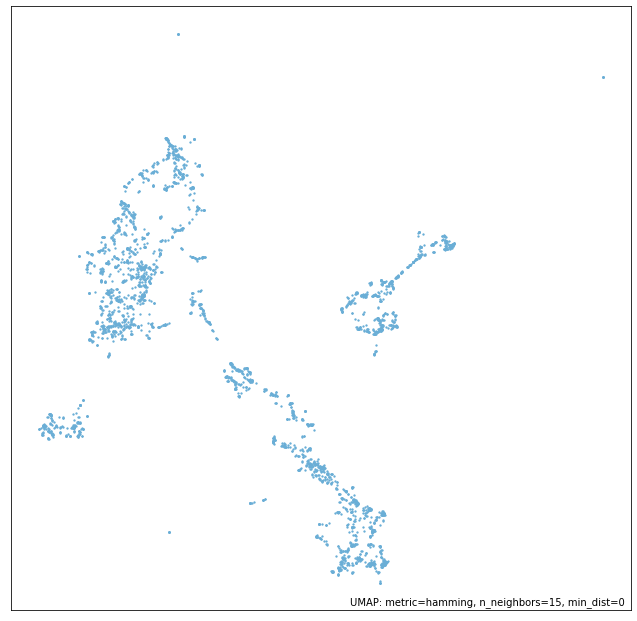

In [ ]:
#hamming
umap.plot.points(visual_mapper)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


<AxesSubplot:>

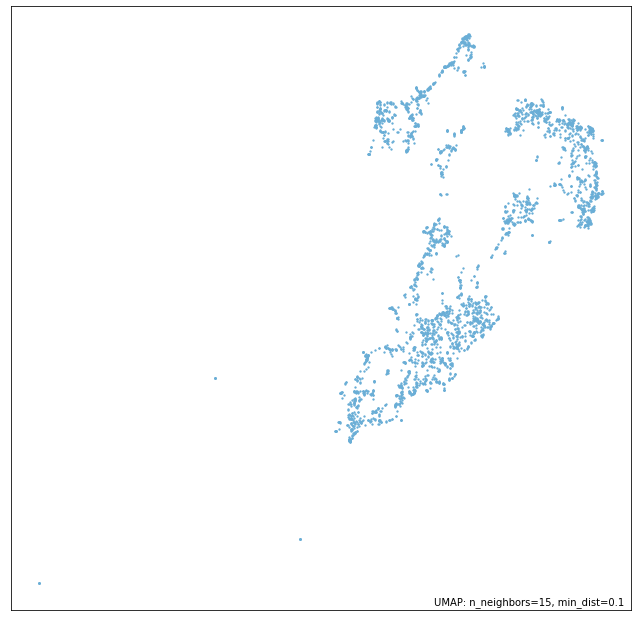

In [ ]:
#euclidean
umap.plot.points(mapper)

In [ ]:
clusterer = hdbscan.HDBSCAN(min_cluster_size = 100).fit(mapper.transform(anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type_exploded_df_all_cell_types))
clusterer


HDBSCAN(min_cluster_size=100)

<AxesSubplot:ylabel='$\\lambda$ value'>

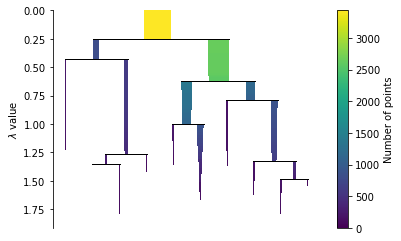

In [ ]:
clusterer.condensed_tree_.plot()

<AxesSubplot:>

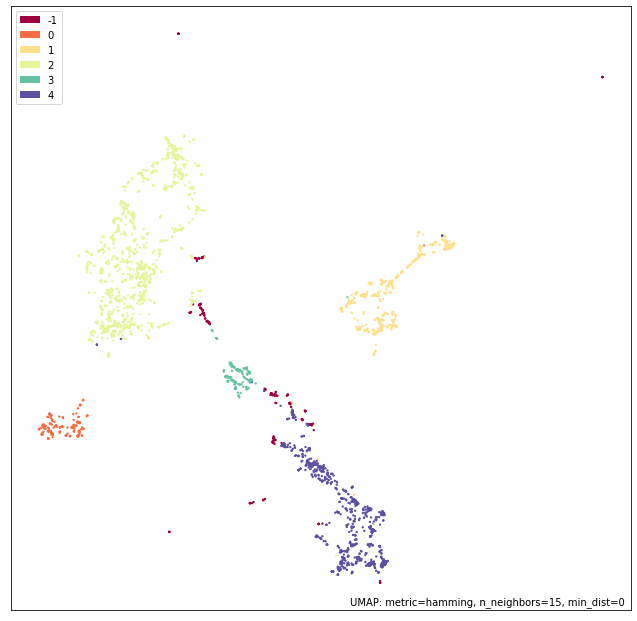

In [ ]:
umap.plot.points(visual_mapper, labels= clusterer.labels_)

In [ ]:
anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type_exploded_df_all_cell_types.assign(cluster = clusterer.labels_).cluster.value_counts()


 2    1391
 4     878
 1     589
-1     210
 0     205
 3     164
Name: cluster, dtype: int64

In [ ]:
test

,chrom,start,end
0,chr1,2021460,2021780
1,chr1,2021960,2022440
2,chr1,3078280,3078314
3,chr1,6007220,6007270
4,chr1,9239900,9240156
...,...,...,...
998,chr9,125890020,125890340
999,chr9,134942434,134942620
1000,chr9,137531140,137531412
1001,chrX,43881965,43882340


In [ ]:
for cluster in np.unique(clusterer.labels_):
    if cluster == -1:
        continue
    test = anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type_exploded_df_all_cell_types\
    .assign(cluster = clusterer.labels_).query("cluster == @cluster").reset_index()["peak_1"].str.split("_", expand = True)
    test.columns = ["chrom", "start", "stop"]
    #test = test.assign(chrom = test["chrom"].str.strip("chr"))
    test[["start", "stop"]] = test[["start", "stop"]].astype(int)
    test = test.sort_values(["chrom","start", "stop"])
    test = BedTool.from_dataframe(test).merge().to_dataframe()

    test.to_csv(f"heritability/cluster{cluster}.tsv", sep = "\t", index = False)


In [ ]:
%bash
ID_name=on_off_on_NAc

for j in cluster0.tsv cluster1.tsv cluster2.tsv cluster3.tsv cluster4.tsv ; do cat $j | awk '{OFMT="%.0f"}{print $1,$2+($3-$2)/2}' | awk '{OFS="\t"}{print $1,$2-2000,$2+2000}' | awk '{if($2<0){$2=0};print}' | awk '{OFS="\t"}{print $1,$2,$3}' > "$j"_2kb_window; cat $j | awk '{OFMT="%.0f"}{print $1,$2+($3-$2)/2}' | awk '{OFS="\t"}{print $1,$2-5000,$2+5000}' | awk '{if($2<0){$2=0};print}' | awk '{OFS="\t"}{print $1,$2,$3}' > "$j"_5kb_window; done


In [ ]:
for j in cluster0.tsv cluster1.tsv cluster2.tsv cluster3.tsv cluster4.tsv; do for i in {1..22}; do bsub -q all_corradin "/lab/corradin_data/ldsc/Run_LDSC_master.sh on_off_on_NAc "$j"_2kb_window part1 $i $i"; bsub -q all_corradin "/lab/corradin_data/ldsc/Run_LDSC_master.sh on_off_on_NAc "$j"_5kb_window part1 $i $i"; done; done

In [ ]:
for j in cluster0.tsv cluster1.tsv cluster2.tsv cluster3.tsv cluster4.tsv
do
bsub -q all_corradin "/lab/corradin_data/ldsc/ldsc_1third.sh $ID_name "$j"_5kb_window part2"
bsub -q all_corradin "/lab/corradin_data/ldsc/ldsc_2third.sh $ID_name "$j"_5kb_window part2"
bsub -q all_corradin "/lab/corradin_data/ldsc/ldsc_3third.sh $ID_name "$j"_5kb_window part2"
done

for j in cluster0.tsv cluster1.tsv cluster2.tsv cluster3.tsv cluster4.tsv
do
bsub -q all_corradin "/lab/corradin_data/ldsc/ldsc_1third.sh $ID_name "$j"_2kb_window part2"
bsub -q all_corradin "/lab/corradin_data/ldsc/ldsc_2third.sh $ID_name "$j"_2kb_window part2"
bsub -q all_corradin "/lab/corradin_data/ldsc/ldsc_3third.sh $ID_name "$j"_2kb_window part2"
done

In [ ]:
ID_name=on_off_on_NAc

for j in cluster0.tsv cluster1.tsv cluster2.tsv cluster3.tsv cluster4.tsv
do
for i in ADHD AgeOfInitiation_GSCAN AlcDep_EUR Alzheimer Anorexia AUD_MVP1_MVP2_Dec11_MVP AUD_MVP1_MVP2_PGC_Dec11_MVP Autism Automobile_speeding_propensity Bipolar_Disorder BipolarDisorder BMI1 BMI C4D_CAD CannabisUD CARDIOGRAM Celiac CigarettesPerDay_GSCAN Coronary_Artery_Disease Crohns_Disease Depression_PGC_UKB Drink_per_week DrinksPerWeek_GSCAN DS Ever_Smoked Fasting_Glucose GAD2eur_dbGAP_MVP HDL Height1 IBD LDL Lupus Multiple_sclerosis Neuroticism Num_Sexual_Partners OPI_DEPvEXP_EUR_PGC OPI_DEPvUNX_EUR_PGC OPI_EXPvUNX_EUR_PGC OUD_EA_MVP1_MVP2_YP_SAGE_Mar12_MVP Primary_biliary_cirrhosis PTSD Rheumatoid_Arthritis Risk_PC1 RiskTolerance Schizophrenia SmokingCessation_GSCAN SmokingInitiation_GSCAN SWB Triglycerides Type_1_Diabetes Type_2_Diabetes Ulcerative_Colitis Years_of_Education1 Years_of_Education2 
do
cat OUT_"$ID_name"_"$i"_"$j"_2kb_window.results | grep L2_0 | awk -v k=$i '{OFS="\t"}{print $1,$5,$6,$7,k}' >> LDSC_results_"$ID_name"_"$j".txt
cat OUT_"$ID_name"_"$i"_"$j"_5kb_window.results | grep L2_0 | awk -v k=$i '{OFS="\t"}{print $1,$5,$6,$7,k}' >> LDSC_results_"$ID_name"_"$j".txt

done
done

In [ ]:
def process_ldsc_result(file, window = True):
    ldsc_result = pd.read_csv(file,
                sep = "\t", header = None, names = ["col", "h2g_enrichment", "h2g_standard_error", "pvalue", "trait"])
    if window:
        ldsc_result = ldsc_result.assign(window = np.tile(["2kb", "5kb"], int(ldsc_result.shape[0]/2)))#
    ldsc_result["log10_pvalue"] = -np.log10(ldsc_result["pvalue"])
    ldsc_result = ldsc_result.sort_values("log10_pvalue", ascending = False)
    return ldsc_result

In [ ]:
ldsc_result_dict[2]

,col,h2g_enrichment,h2g_standard_error,pvalue,trait,window,log10_pvalue
24,L2_0,5.367435,1.761262,0.012463,BMI,2kb,1.904369
25,L2_0,3.154254,0.913415,0.017705,BMI,5kb,1.751902
55,L2_0,16.745514,7.100923,0.030487,HDL,5kb,1.515886
66,L2_0,10.471947,4.802982,0.040361,Neuroticism,2kb,1.394038
41,L2_0,4.214891,1.594752,0.042426,Depression_PGC_UKB,5kb,1.372372
...,...,...,...,...,...,...,...
93,L2_0,0.922947,0.964471,0.936356,SmokingInitiation_GSCAN,5kb,0.028559
95,L2_0,1.133518,3.741993,0.971501,SWB,5kb,0.012557
0,L2_0,0.807373,5.492961,0.972034,ADHD,2kb,0.012318
4,L2_0,0.277968,20.623532,0.972141,AlcDep_EUR,2kb,0.012271


In [ ]:
ldsc_result_dict = {cluster: process_ldsc_result(
    f"/lab/corradin_biobank/FOR_AN/brain-regions-2022/notebooks/analyses/heritability/LDSC_results_on_off_on_NAc_cluster{cluster}.tsv.txt" 
) for cluster in range(5)}


In [ ]:
-np.log10(0.05/ldsc_result.trait.nunique())

3.03342375548695

0


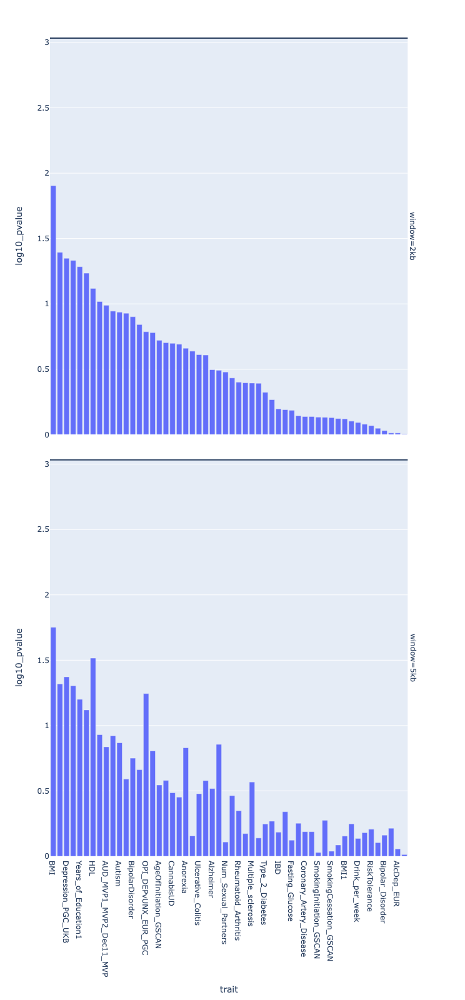

1


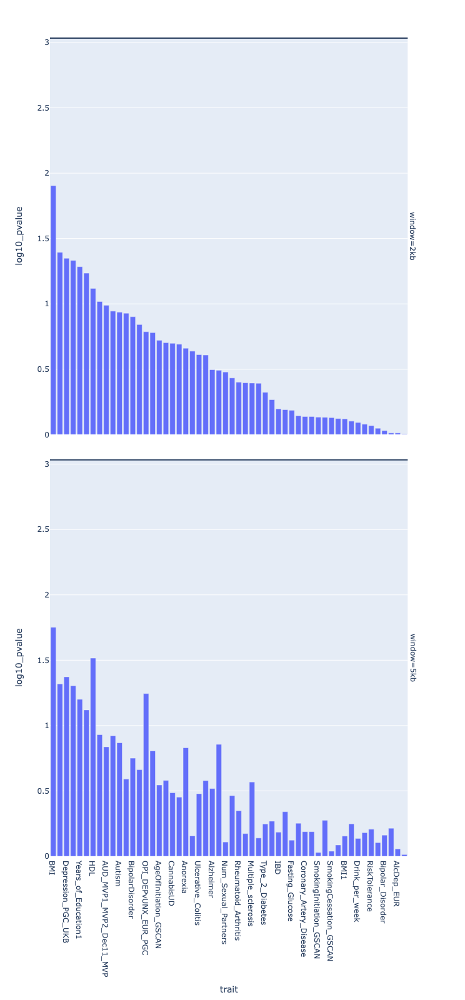

2


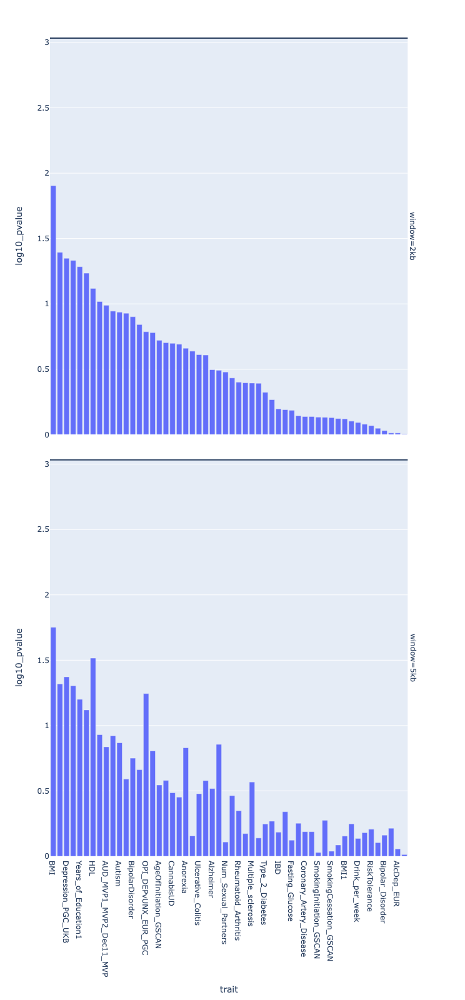

3


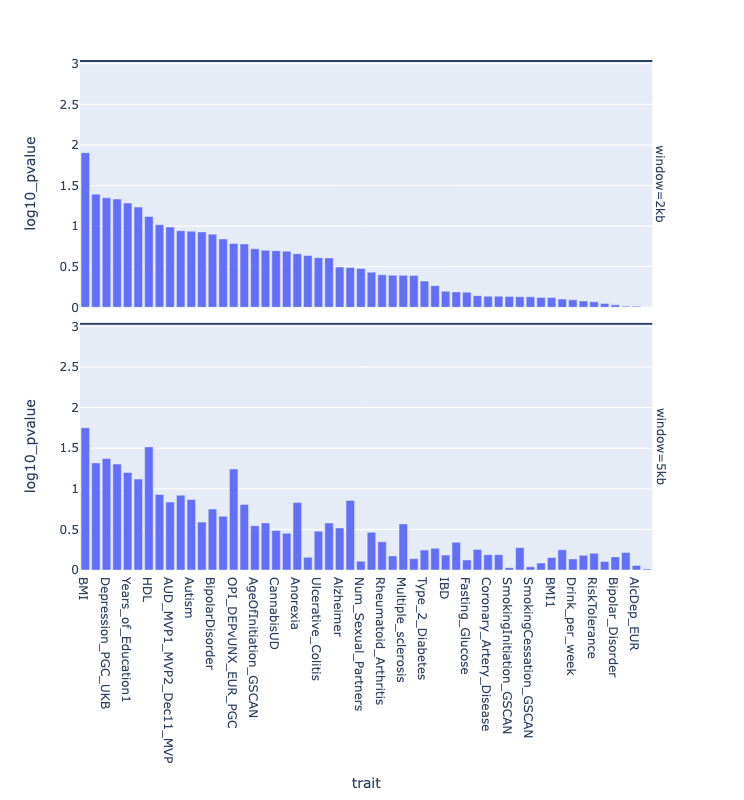

4


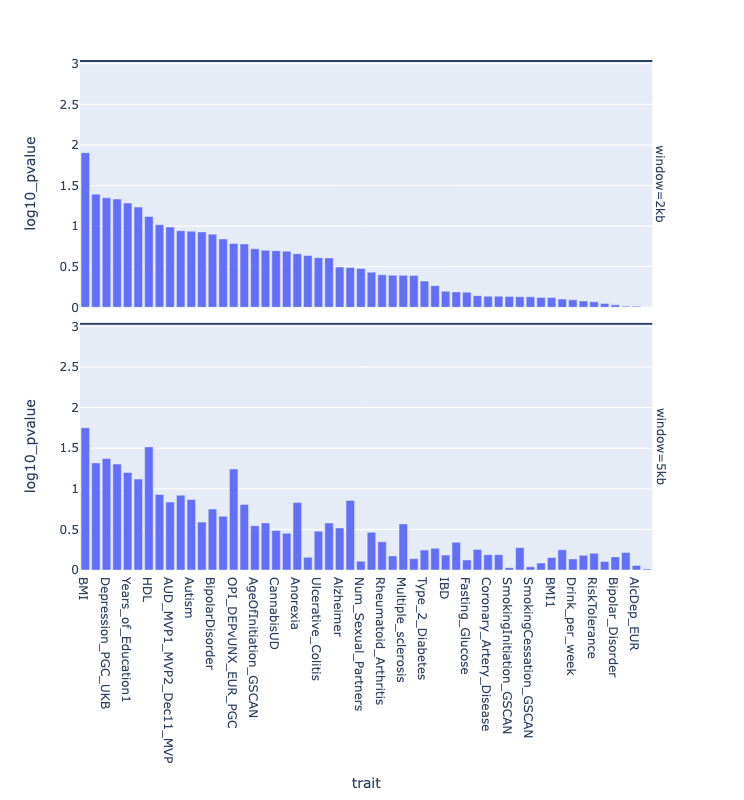

In [ ]:
for cluster,df in ldsc_result_dict.items():
    print(cluster)
    fig = px.bar(df,x = "trait", y = "log10_pvalue", barmode = "group", facet_row = "window", height = 800)
    fig.add_hline(y = -np.log10(0.05/df.trait.nunique()))
    display(fig)

0_1


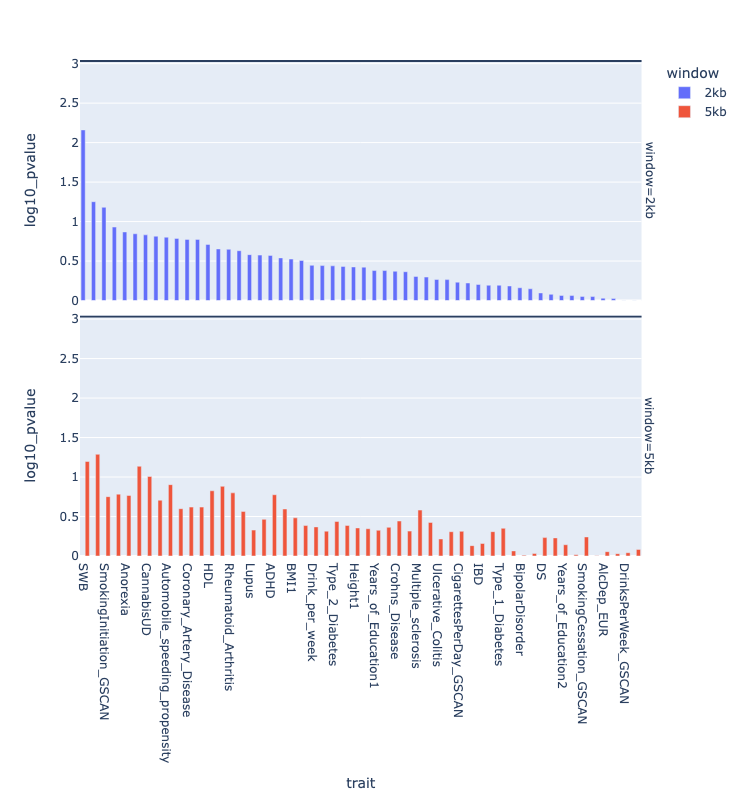

2


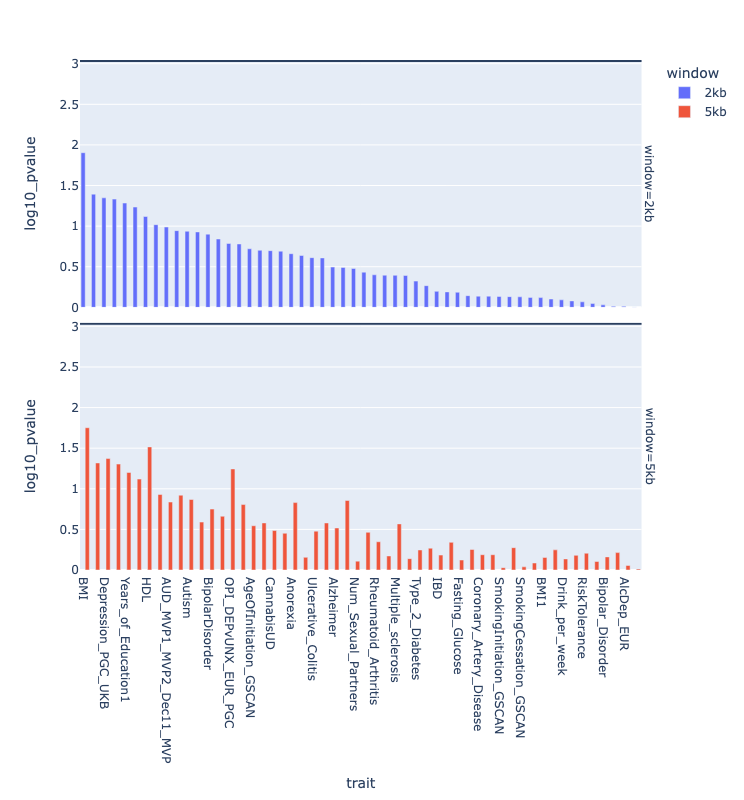

3


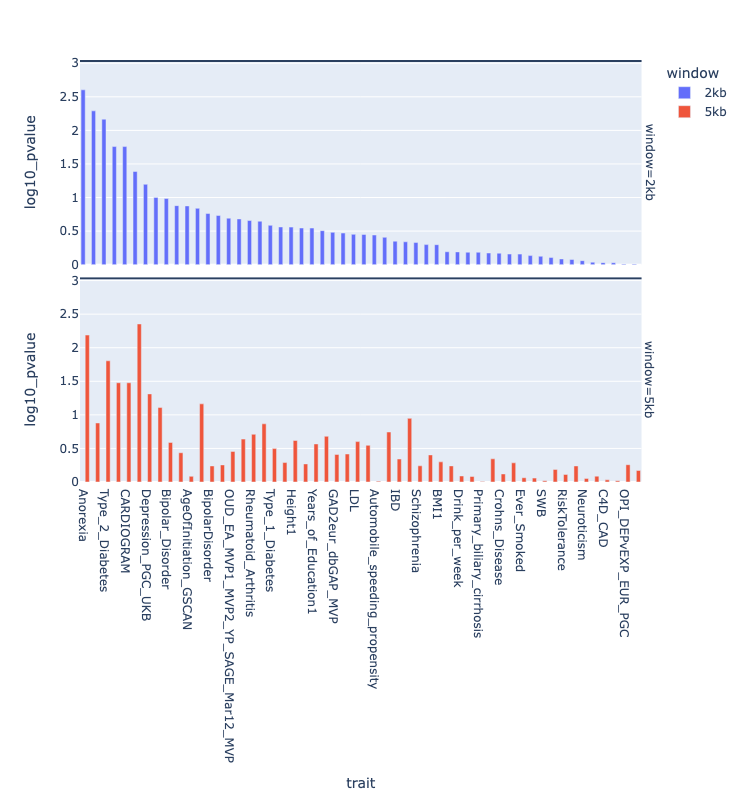

4


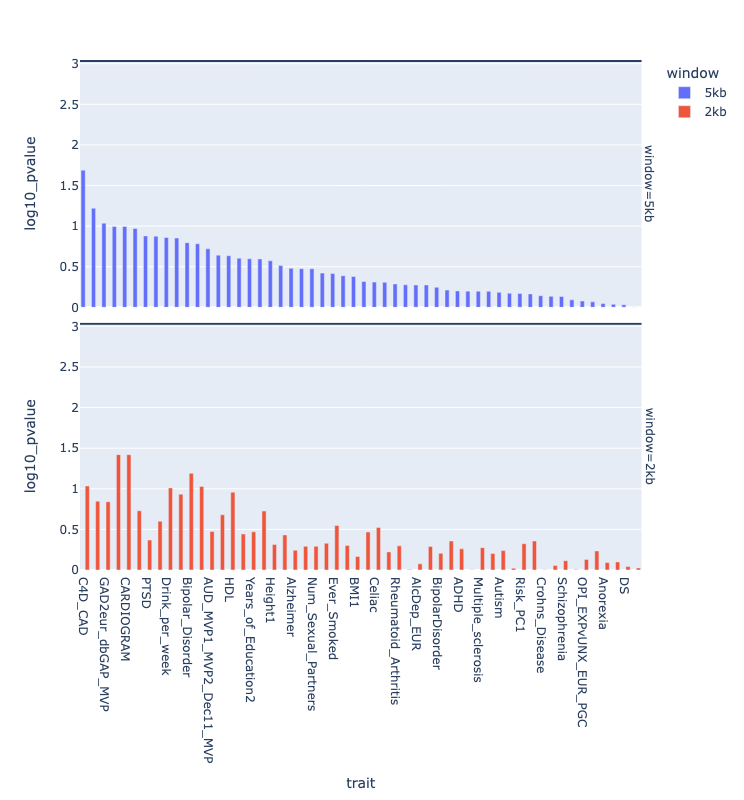

In [ ]:
ldsc_result_dict = {cluster: process_ldsc_result(
    f"/lab/corradin_biobank/FOR_AN/brain-regions-2022/notebooks/analyses/heritability/LDSC_results_on_off_on_NAc_combine_01_cluster{cluster}.tsv.txt" 
) for cluster in ["0_1", "2", "3", "4"]}
for cluster,df in ldsc_result_dict.items():
    print(cluster)
    fig = px.bar(df,x = "trait", y = "log10_pvalue", barmode = "group", facet_row = "window", color = "window", height = 800)
    fig.add_hline(y = -np.log10(0.05/df.trait.nunique()))
    display(fig)

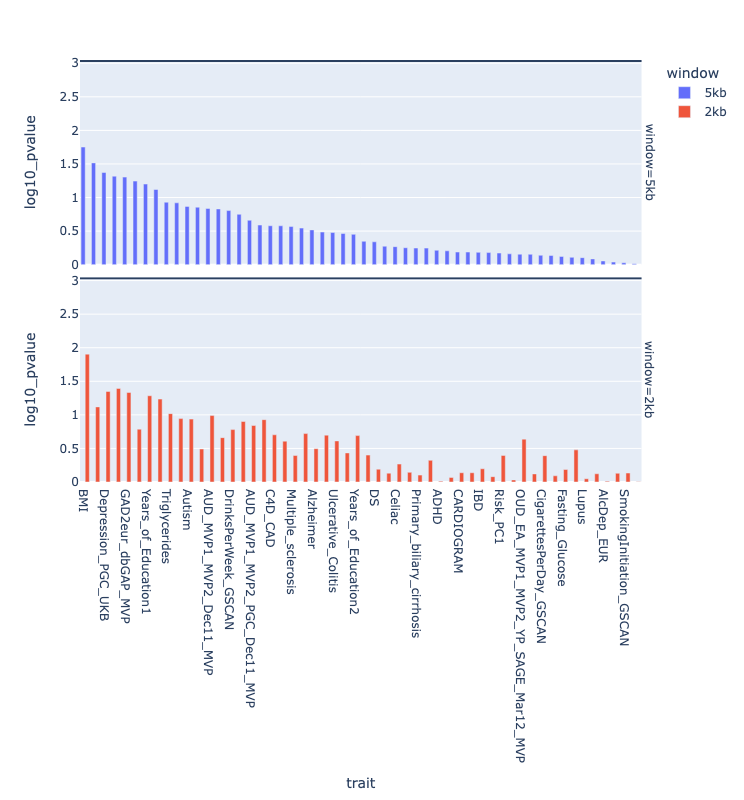

In [ ]:
fig = px.bar(ldsc_result.sort_values(["window", "log10_pvalue"], ascending = [False, False]),x = "trait", y = "log10_pvalue", barmode = "group", facet_row = "window", height = 800, color = "window")
fig.add_hline(y = -np.log10(0.05/ldsc_result.trait.nunique()))

In [ ]:
anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type_exploded_df_all_cell_types.assign(cluster = clusterer.labels_).groupby("cluster").sum()[["Medium spiny neurons - type 2", "Oligodendrocytes - type 2",  ]]

-1

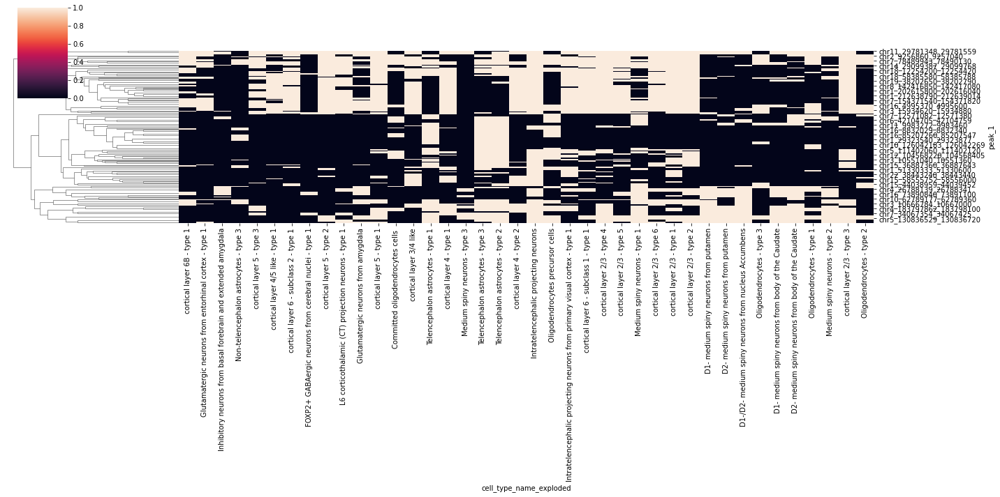

0

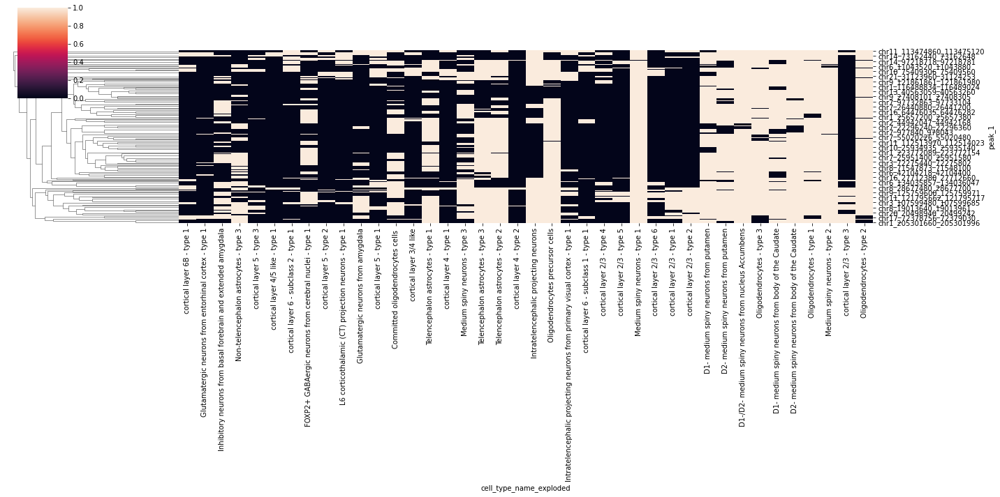

1

/lab/corradin_biobank/FOR_AN/brain-regions-2022/.venv/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



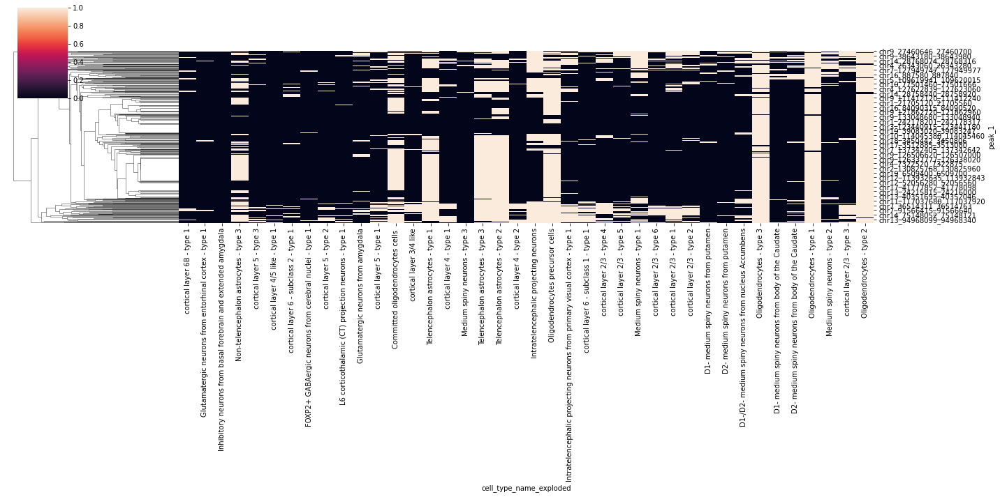

2

/lab/corradin_biobank/FOR_AN/brain-regions-2022/.venv/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



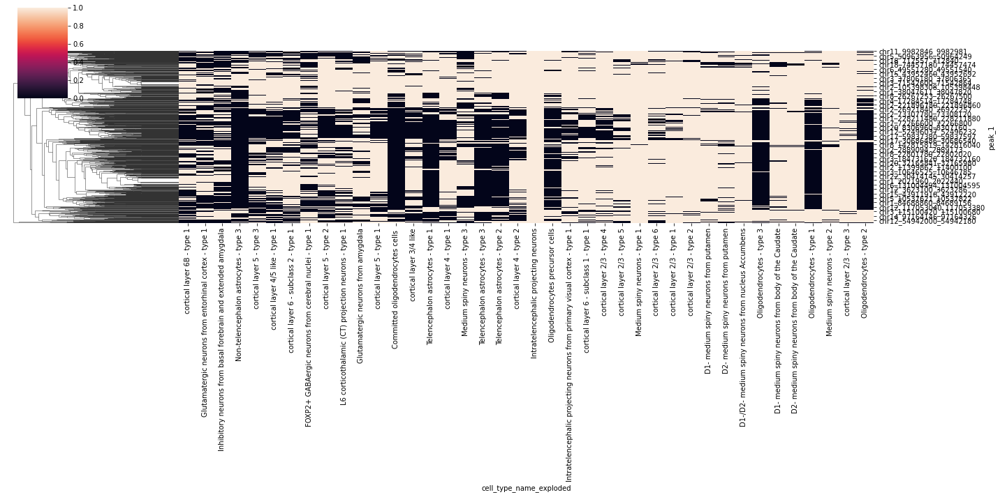

3

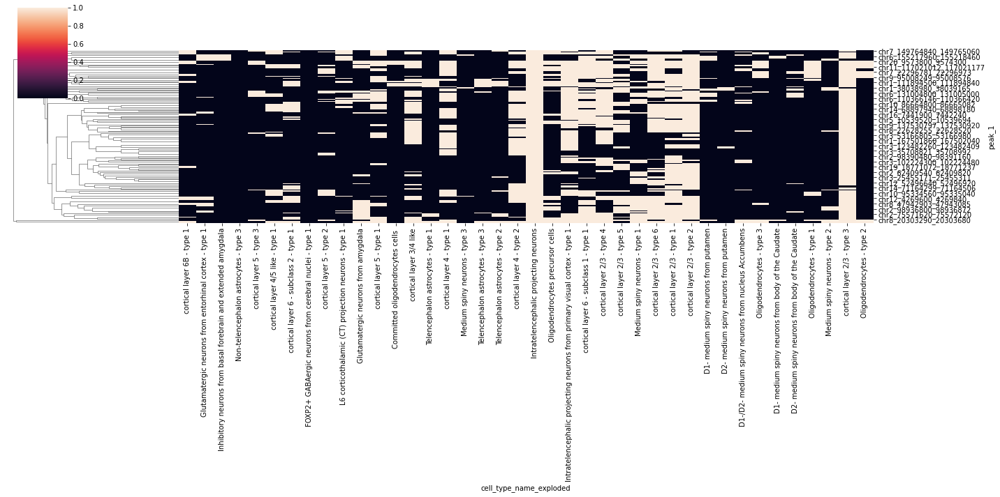

4

/lab/corradin_biobank/FOR_AN/brain-regions-2022/.venv/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



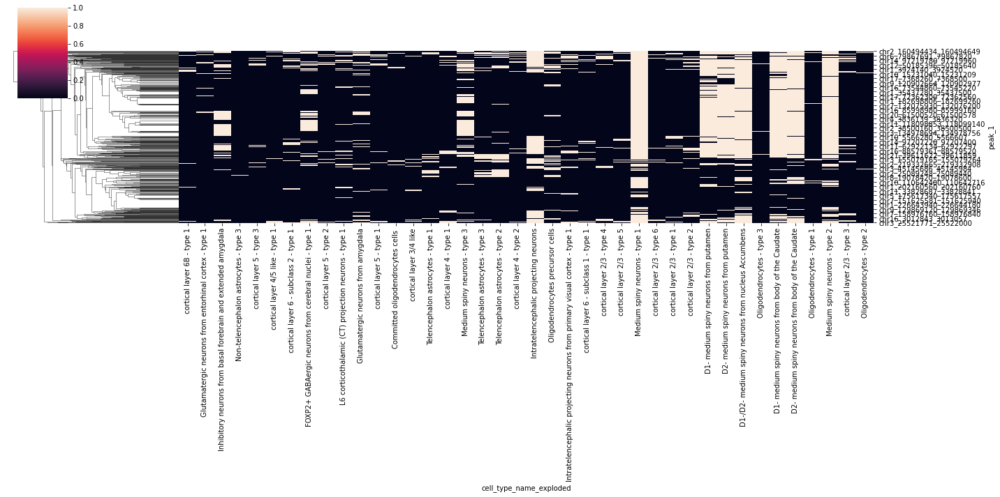

In [ ]:
cluster_diff_cols = anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type_exploded_df_all_cell_types.assign(cluster = clusterer.labels_).query("cluster != -1").groupby("cluster").mean().std().sort_values().tail(40).index.tolist()

for cluster in np.unique(clusterer.labels_):
    display(cluster)
    plot_df = anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type_exploded_df_all_cell_types.assign(cluster = clusterer.labels_).query("cluster == @cluster").drop(columns = ["cluster"])
    #cols_to_include = list(set(plot_df.sum().sort_values(ascending = False).head(20).index.tolist() + plot_df.std().sort_values(ascending = False).head(20).index.tolist() + plot_df.std().sort_values(ascending = False).tail(20).index.tolist()))
    sns.clustermap(plot_df[cluster_diff_cols], col_cluster=False, figsize = (20,10))
    
    plt.show()


-1

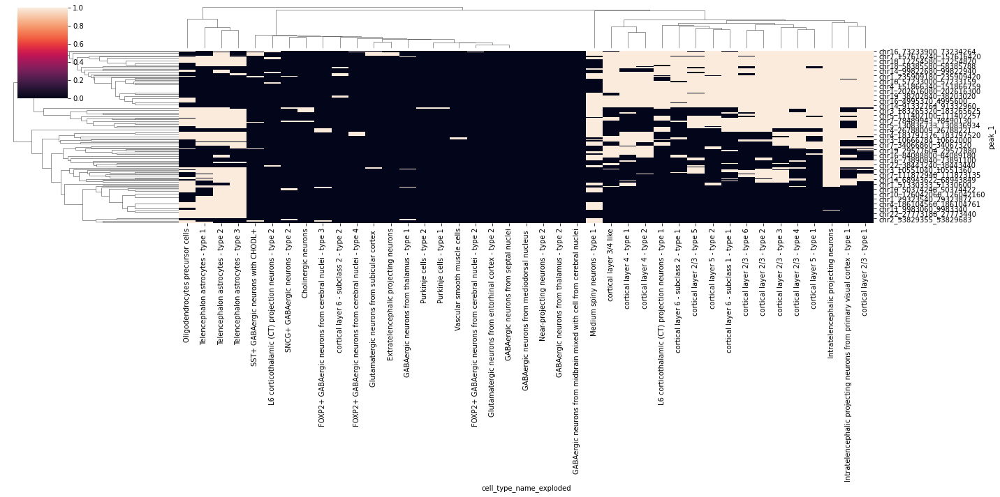

0

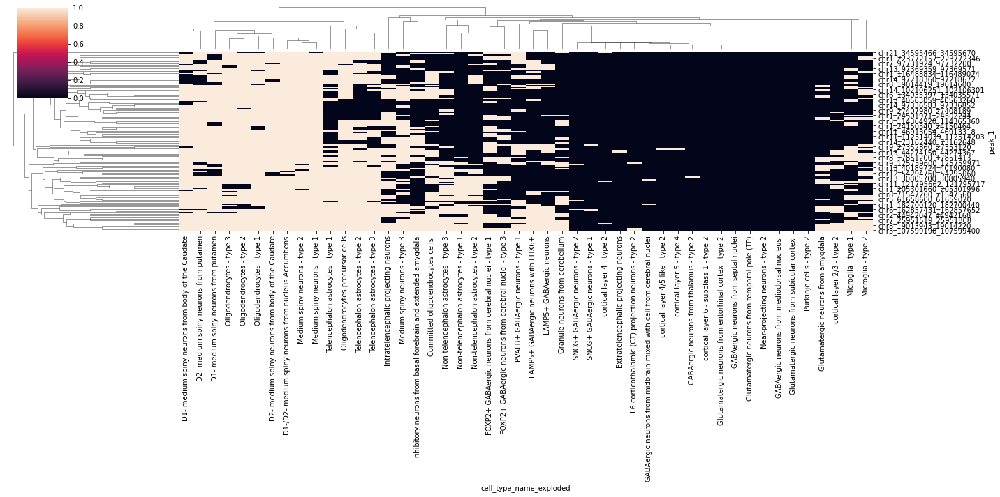

1

/lab/corradin_biobank/FOR_AN/brain-regions-2022/.venv/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



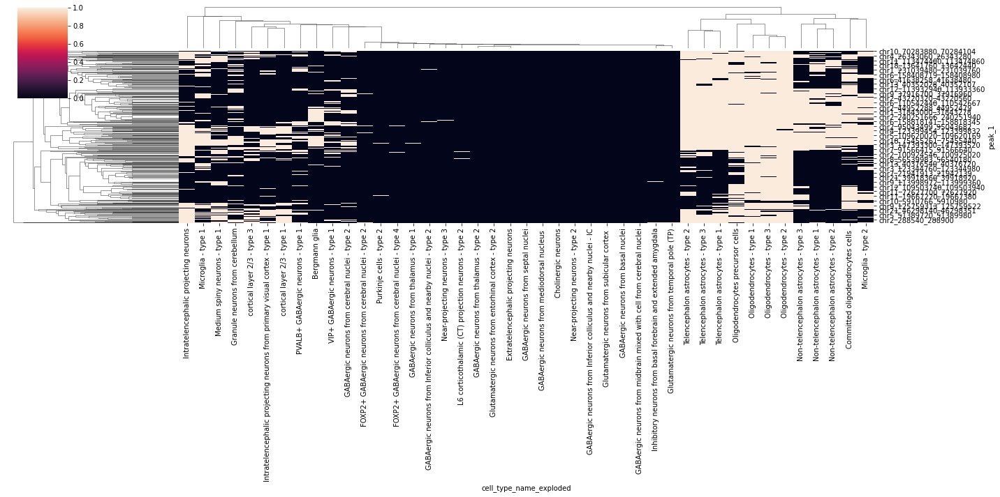

2

/lab/corradin_biobank/FOR_AN/brain-regions-2022/.venv/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



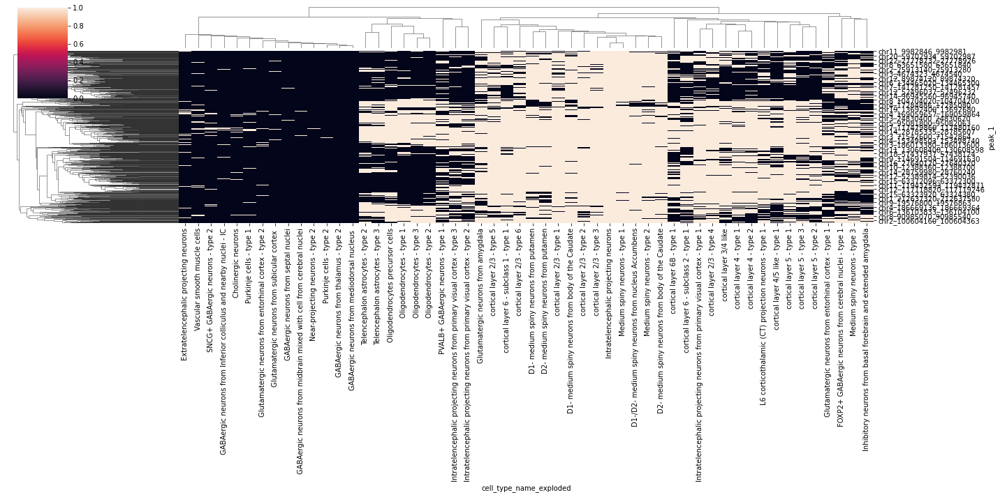

3

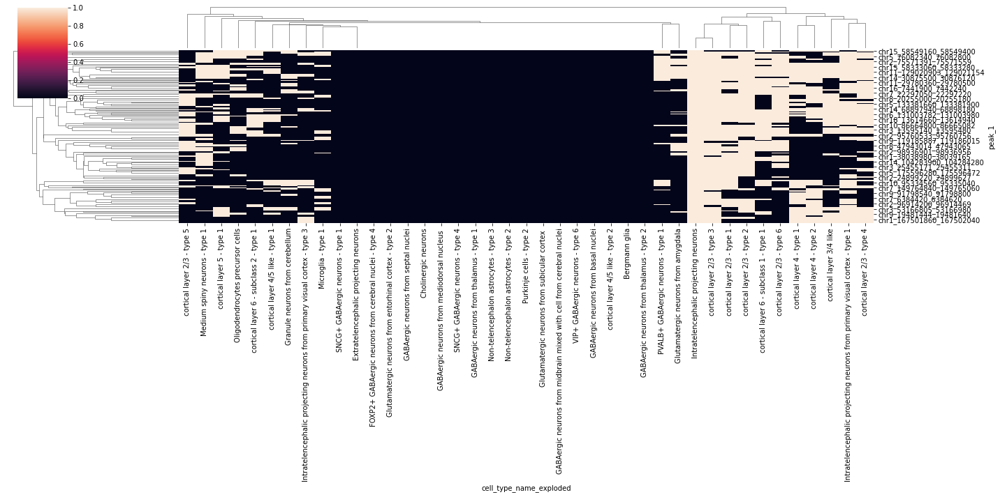

4

/lab/corradin_biobank/FOR_AN/brain-regions-2022/.venv/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



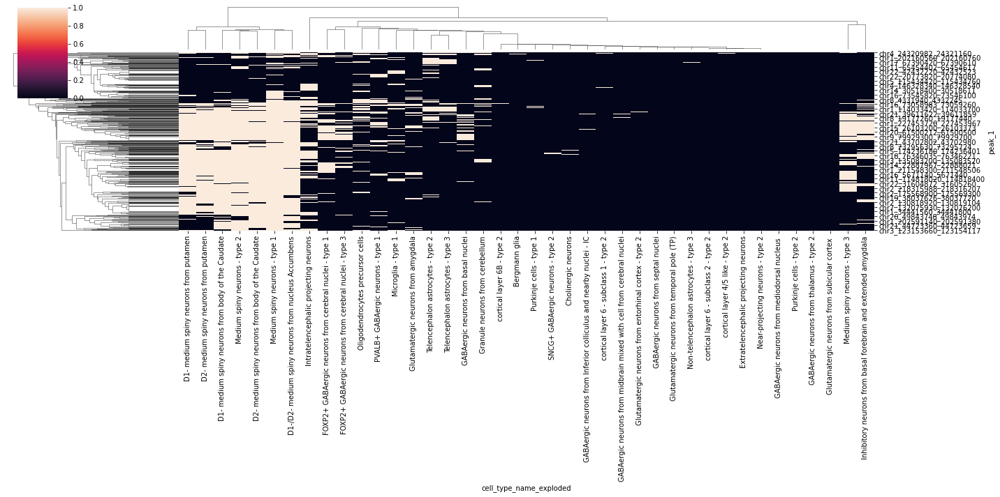

In [ ]:
for cluster in np.unique(clusterer.labels_):
    display(cluster)
    plot_df = anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type_exploded_df_all_cell_types.assign(cluster = clusterer.labels_).query("cluster == @cluster").drop(columns = ["cluster"])
    cols_to_include = list(set(plot_df.sum().sort_values(ascending = False).head(20).index.tolist() + plot_df.std().sort_values(ascending = False).head(20).index.tolist() + plot_df.std().sort_values(ascending = False).tail(20).index.tolist()))
    sns.clustermap(plot_df[cols_to_include], figsize = (20,10))
    
    plt.show()
    

peak_1
chr20_31860488_31860800      1
chr17_72174780_72175320      1
chr17_67217000_67217212      1
chr11_74687180_74687380      1
chr11_65454655_65454898      1
                            ..
chr13_91347400_91347421     89
chr3_102673620_102673810    89
chr3_71542600_71542864      90
chr21_33894840_33895040     91
chr21_33894634_33894786     91
Name: cell_type_name_exploded, Length: 3437, dtype: int64

Medium spiny neurons - type 1                          2627
Intratelencephalic projecting neurons                  2394
D1-/D2- medium spiny neurons from nucleus Accumbens    2327
Medium spiny neurons - type 2                          2290
D2- medium spiny neurons from body of the Caudate      2279
                                                       ... 
GABAergic neurons from septal nuclei                     15
Purkinje cells - type 2                                  11
Near-projecting neurons - type 2                          9
GABAergic neurons from thalamus - type 2                  5
GABAergic neurons from mediodorsal nucleus                2
Name: cell_type_name_exploded, Length: 104, dtype: int64

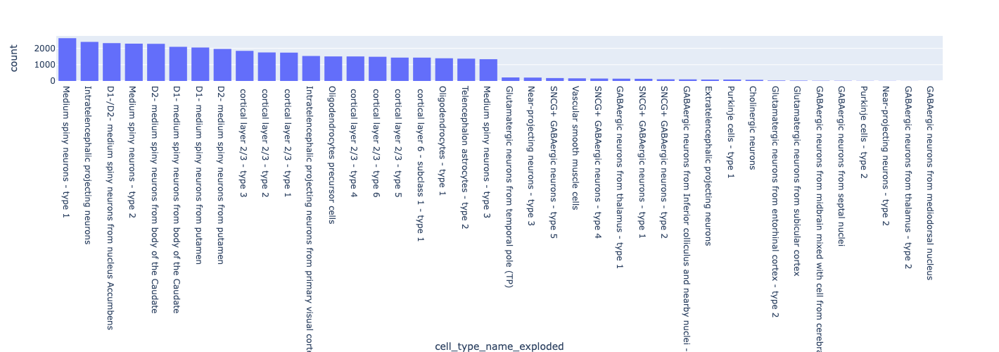

In [ ]:
anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type_exploded_df = plot_cell_type_merged_bingren(anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type)


In [ ]:
anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type_exploded_df.query("")

cell_type_name_exploded,Medium spiny neurons - type 1,Intratelencephalic projecting neurons,D1-/D2- medium spiny neurons from nucleus Accumbens,Medium spiny neurons - type 2,D2- medium spiny neurons from body of the Caudate,D1- medium spiny neurons from body of the Caudate,D1- medium spiny neurons from putamen,D2- medium spiny neurons from putamen,cortical layer 2/3 - type 3,cortical layer 2/3 - type 2,...,cortical layer 6 - subclass 2 - type 1,FOXP2+ GABAergic neurons from cerebral nuclei - type 1,PVALB+ GABAergic neurons - type 1,cortical layer 5 - type 2,Inhibitory neurons from basal forebrain and extended amygdala,cortical layer 5 - type 3,Committed oligodendrocytes cells,cortical layer 4/5 like - type 1,Microglia - type 1,cortical layer 6B - type 1
peak_1,,,,,,,,,,,,,,,,,,,,,
chr10_101066180_101066540,1,1,1,0,1,0,0,1,1,1,...,1,0,1,0,0,1,0,1,0,1
chr10_101923820_101924000,1,1,1,1,1,1,1,1,1,1,...,1,0,1,0,0,0,0,0,0,0
chr10_10292660_10293040,1,1,1,1,1,0,1,0,1,1,...,1,0,1,0,0,1,0,0,0,0
chr10_102948260_102948540,1,1,1,1,1,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
chr10_104033194_104034360,1,0,1,1,1,0,1,1,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
chr9_97564378_97564560,0,1,0,0,0,0,0,0,1,1,...,0,0,1,0,0,1,1,0,0,0
chr9_97564560_97564820,0,1,0,0,0,0,0,0,1,1,...,0,0,1,0,0,1,1,0,0,0
chrX_43881965_43882220,1,1,1,1,1,1,1,1,1,1,...,1,1,0,1,0,1,1,1,0,1


In [ ]:
anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type_exploded_df

cell_type_name_exploded,Medium spiny neurons - type 1,Intratelencephalic projecting neurons,D1-/D2- medium spiny neurons from nucleus Accumbens,Medium spiny neurons - type 2,D2- medium spiny neurons from body of the Caudate,D1- medium spiny neurons from body of the Caudate,D1- medium spiny neurons from putamen,D2- medium spiny neurons from putamen,cortical layer 2/3 - type 3,cortical layer 2/3 - type 2,...,cortical layer 6 - subclass 2 - type 1,FOXP2+ GABAergic neurons from cerebral nuclei - type 1,PVALB+ GABAergic neurons - type 1,cortical layer 5 - type 2,Inhibitory neurons from basal forebrain and extended amygdala,cortical layer 5 - type 3,Committed oligodendrocytes cells,cortical layer 4/5 like - type 1,Microglia - type 1,cortical layer 6B - type 1
peak_1,,,,,,,,,,,,,,,,,,,,,
chr10_101066180_101066540,1,1,1,0,1,0,0,1,1,1,...,1,0,1,0,0,1,0,1,0,1
chr10_101923820_101924000,1,1,1,1,1,1,1,1,1,1,...,1,0,1,0,0,0,0,0,0,0
chr10_10292660_10293040,1,1,1,1,1,0,1,0,1,1,...,1,0,1,0,0,1,0,0,0,0
chr10_102948260_102948540,1,1,1,1,1,1,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
chr10_104033194_104034360,1,0,1,1,1,0,1,1,0,0,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
chr9_97564378_97564560,0,1,0,0,0,0,0,0,1,1,...,0,0,1,0,0,1,1,0,0,0
chr9_97564560_97564820,0,1,0,0,0,0,0,0,1,1,...,0,0,1,0,0,1,1,0,0,0
chrX_43881965_43882220,1,1,1,1,1,1,1,1,1,1,...,1,1,0,1,0,1,1,1,0,1


In [ ]:
UMAP

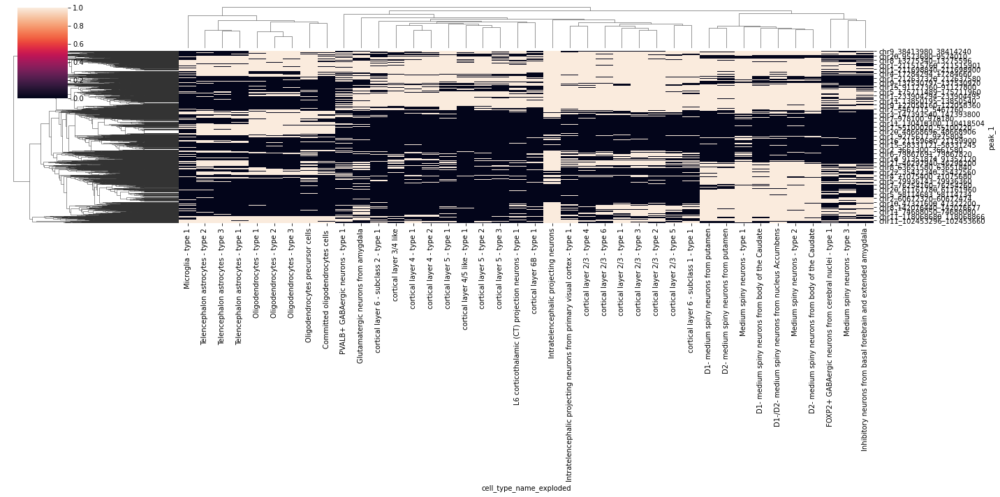

In [ ]:
import seaborn as sns
clustermap_obj = sns.clustermap(anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type_exploded_df, figsize=(20,10))

/lab/corradin_biobank/FOR_AN/brain-regions-2022/.venv/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



<seaborn.matrix.ClusterGrid>

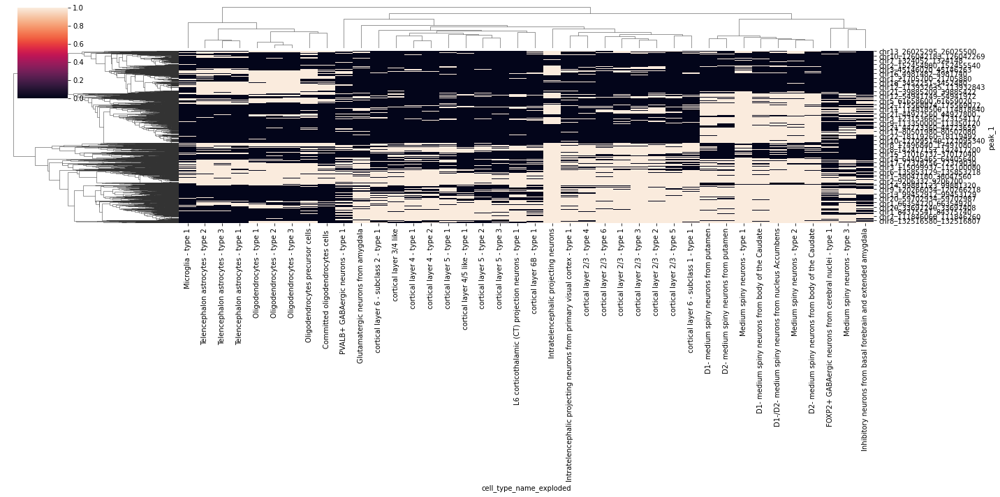

In [ ]:
sns.clustermap(anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type_exploded_df, figsize=(20,10), metric = "hamming")

/lab/corradin_biobank/FOR_AN/brain-regions-2022/.venv/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



<seaborn.matrix.ClusterGrid>

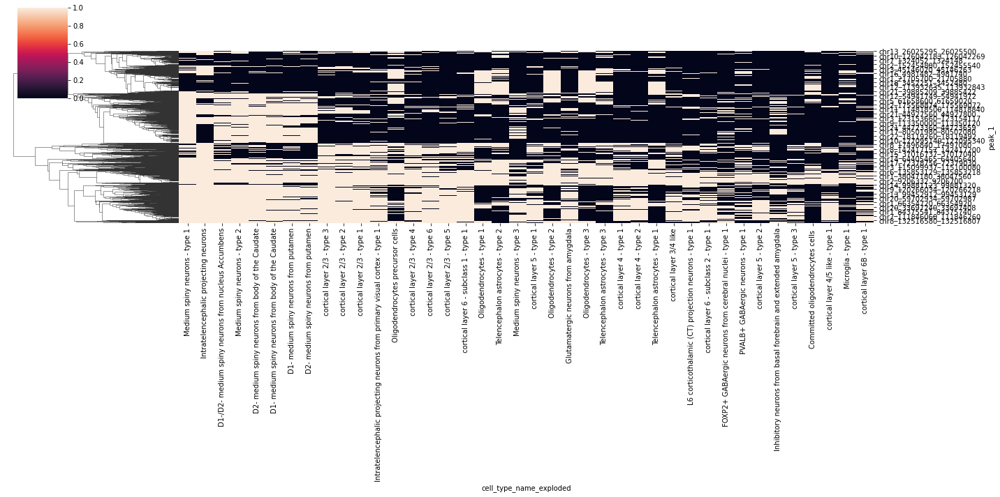

In [ ]:
sns.clustermap(anova_sig_brain_regions_threshold_binary_on_NAc_with_cell_type_exploded_df, figsize=(20,10), metric = "hamming", col_cluster = False)

peak_1
chr3_42266116_42266140       1
chr4_133146120_133146460     1
chr1_11700520_11700760       1
chr14_99254300_99254568      2
chr3_10285079_10285433       2
                            ..
chr14_28774720_28774900     88
chr2_17518340_17518660      89
chr2_17518680_17518780      89
chrX_78104140_78104540      94
chr20_56358758_56358940     96
Name: cell_type_name_exploded, Length: 1038, dtype: int64

Intratelencephalic projecting neurons                                   948
 cortical layer 2/3 - type 3                                            856
 cortical layer 2/3 - type 2                                            828
 cortical layer 2/3 - type 1                                            781
 cortical layer 2/3 - type 4                                            771
                                                                       ... 
Glutamatergic neurons from subicular cortex                              15
Near-projecting neurons - type 2                                          8
Purkinje cells - type 2                                                   6
GABAergic neurons from midbrain mixed with cell from cerebral nuclei      3
GABAergic neurons from thalamus - type 2                                  2
Name: cell_type_name_exploded, Length: 103, dtype: int64

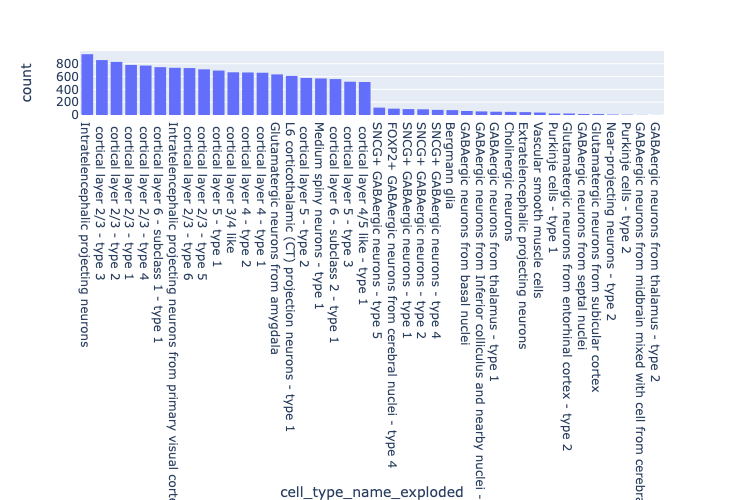

In [ ]:
plot_cell_type_merged_bingren(anova_sig_brain_regions_threshold_binary_on_Amyg_with_cell_type)

peak_1
chr12_90023600_90023840      1
chr11_74687180_74687380      1
chr2_38494480_38494765       1
chr1_229230540_229230760     1
chr1_229230660_229230865     1
                            ..
chr3_71542600_71542864      90
chr21_33894840_33895040     91
chr21_33894634_33894786     91
chrX_78104140_78104540      94
chr20_56358758_56358940     96
Name: cell_type_name_exploded, Length: 4062, dtype: int64

Intratelencephalic projecting neurons                                   2971
Medium spiny neurons - type 1                                           2871
D1-/D2- medium spiny neurons from nucleus Accumbens                     2524
Medium spiny neurons - type 2                                           2461
D2- medium spiny neurons from body of the Caudate                       2455
                                                                        ... 
GABAergic neurons from midbrain mixed with cell from cerebral nuclei      19
Purkinje cells - type 2                                                   17
Near-projecting neurons - type 2                                          14
GABAergic neurons from thalamus - type 2                                   6
GABAergic neurons from mediodorsal nucleus                                 2
Name: cell_type_name_exploded, Length: 104, dtype: int64

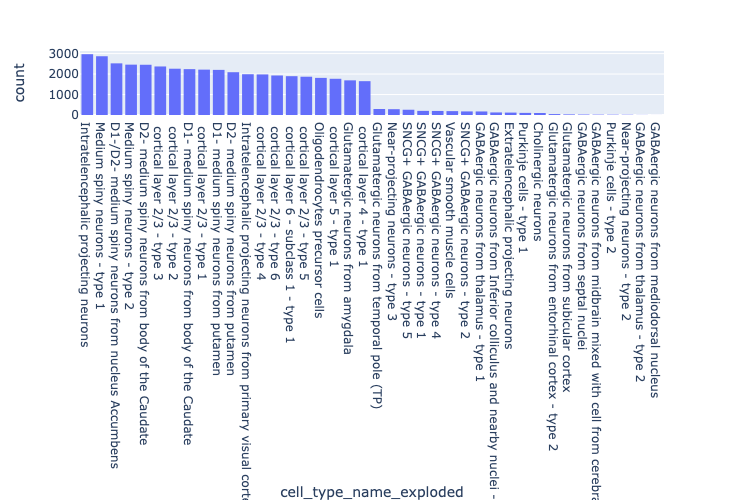

In [ ]:
plot_cell_type_merged_bingren(data_df)

peak_1
chr11_65454655_65454898       1
chr10_70523080_70523291       1
chr15_81292120_81292460       1
chr7_151625581_151625940      1
chr10_132498218_132498543     2
                             ..
chr10_35347222_35347440      63
chr12_75209368_75209600      67
chr12_75209580_75209760      67
chr12_75209705_75209920      67
chr14_28774720_28774900      88
Name: cell_type_name_exploded, Length: 271, dtype: int64

Medium spiny neurons - type 1                                           194
Intratelencephalic projecting neurons                                   188
D1-/D2- medium spiny neurons from nucleus Accumbens                     174
Medium spiny neurons - type 2                                           172
D2- medium spiny neurons from body of the Caudate                       167
                                                                       ... 
GABAergic neurons from Inferior colliculus and nearby nuclei - IC         3
GABAergic neurons from septal nuclei                                      2
Purkinje cells - type 1                                                   2
GABAergic neurons from midbrain mixed with cell from cerebral nuclei      1
GABAergic neurons from mediodorsal nucleus                                1
Name: cell_type_name_exploded, Length: 99, dtype: int64

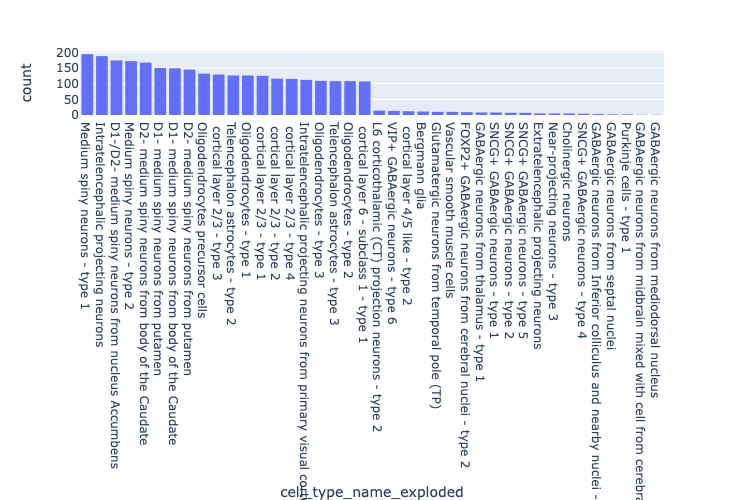

In [ ]:
plot_cell_type_merged_bingren(data_df, p_value_thresh = 0.00005)

Glia/Neuron vs Brain region same paper?
Megan prioritize experiment?
Outline figures?